In [643]:
import sys
import os
import pandas as pd
from ema_workbench.analysis.parcoords import ParallelAxes, get_limits
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 5]
sys.path.append('..')
import numpy as np
import random
from sklearn.preprocessing import MinMaxScaler #to rescale Euclidean mean
from itertools import chain
from platypus import Solution, Problem

import problem_formulation_original, problem_formulation_gini, problem_formulation_euclidean

In [644]:
current_directory = os.getcwd()  # Get the current working directory
# new_directory = os.path.join(current_directory, "Users", "farleyrimon", "Documents", "Model_results")

# Loading solutions (only objectives)

## Make a dictionary out of all solutions

In [781]:
#Add your directory here
# os.chdir('/Users/farleyrimon/Documents/Model_results/Experiment 2')

pareto_sets = {}
# pareto_sets_test = {}

ethical_formulations = ['TraditionalPrinciple',
                        'CombinedTraditionalGiniMean', 
                        'CombinedTraditionalGiniStd',
                        'CombinedTraditionalGiniRatioStdMean',
                        'CombinedTraditionalEuclideanMean',
                        'CombinedTraditionalEuclideanStd',
                        'CombinedTraditionalEuclideanRatioStdMean',
]


for entry in ethical_formulations:
    solutions = []
    folder_destination = '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/output_farley'
#     output = 'output_farley'
#     name = entry.__name__
    output_dir = f"{folder_destination}/{entry}/"
    for filename in os.listdir(output_dir):
        if filename.endswith('solution.csv'):
            df_temp = pd.read_csv(f"{output_dir}{filename}", header=0).abs()
            solutions.append(df_temp.values.tolist())
#             pareto_sets_test[name] = list(chain.from_iterable(solutions))
            pareto_sets[entry] = df_temp
# df_temp['equity'] *= -1
pareto_sets['TraditionalPrinciple']['equity'] = np.nan

In [805]:
pareto_sets[ethical_formulations[0]].min()

hydropower revenue          6.238959
atomic plant reliability    0.000254
baltimore reliability       0.002459
chester reliability         0.000684
environment reliability     0.092056
recreation reliability      0.607143
equity                           NaN
dtype: float64

# Generate reference sets

We ought to make sure that the reference set is separate for every principle.

In [787]:
pareto_sets_w_variables = {}

for entry in ethical_formulations:
    solutions = []
    sets_per_seed = []
    name = entry
    output_dir = f"{folder_destination}/{name}/"
    
    seeds = [10,20,30,40,50]
    for seed in seeds:
        solutions = pd.read_csv(os.path.join(output_dir, f"{seed}_solution.csv")).abs()
        variables = pd.read_csv(os.path.join(output_dir, f"{seed}_variables.csv"), header=None)
        
        combined = pd.concat([variables, solutions], axis=1)
        sets_per_seed.append(combined)
    
    pareto_sets_w_variables[entry] = pd.concat(sets_per_seed)


print("Amount of solutions for each principle:")
for problem_form in pareto_sets_w_variables:
    print(problem_form, len(pareto_sets_w_variables[problem_form]))
    

Amount of solutions for each principle:
TraditionalPrinciple 17205
CombinedTraditionalGiniMean 16248
CombinedTraditionalGiniStd 12612
CombinedTraditionalGiniRatioStdMean 14830
CombinedTraditionalEuclideanMean 53749
CombinedTraditionalEuclideanStd 16782
CombinedTraditionalEuclideanRatioStdMean 13694


Quickly add an empty equity column for the Traditional Principle for this to work

In [788]:
pareto_sets_w_variables['TraditionalPrinciple']['equity'] = 0


# indicate you want data stored in project folder
folder_destination_data = '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/refsets'


In [855]:
# this code produces the reference set per principle, but in the stored results also included the associated decision variables
import pareto

if not os.path.exists(folder_destination_data):
    os.mkdir(folder_destination_data)
    print("Folder created:", folder_destination_data)
else:
    print("Folder already exists:", folder_destination_data)
    
reference_sets = {}

for problem_formulation in pareto_sets_w_variables:
    data = pareto_sets_w_variables[problem_formulation]
    
    if problem_formulation == 'TraditionalPrinciple':
        # change to maximize 36 as well after your tests
        nondominated = pareto.eps_sort([data.values], [32, 33, 34, 35, 36, 37], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05], maximize=[32, 33, 34, 35, 37])
        reference_sets[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=data.columns)
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_refset_with_variables.csv", index=False, header=True)
    else:
        # change to maximize 36 as well after your tests
        nondominated = pareto.eps_sort([data.values], [32, 33, 34, 35, 36, 37, 38], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05, 0.1], maximize=[32, 33, 34, 35, 37])
        reference_sets[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=data.columns)
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_refset_with_variables.csv", index=False, header=True)
       
reference_sets_sol = {}

for problem_formulation in pareto_sets:
    data = pareto_sets[problem_formulation]
    if problem_formulation == 'TraditionalPrinciple':
        # change to maximize 4 as well after your tests
        nondominated = pareto.eps_sort([data.values], [0,1,2,3,4,5], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05], maximize=[0,1,2,3,5])
        reference_sets_sol[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=['hydropower', 'atomicpowerplant', 'baltimore', 'chester', 'environment', 'recreation','equity'])
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_refset.csv", index=False, header=True)
    else:
        # change to maximize 4 as well after your tests
        nondominated = pareto.eps_sort([data.values], [0,1,2,3,4,5,6], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05, 0.1], maximize=[0,1,2,3,5])
        reference_sets_sol[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=['hydropower', 'atomicpowerplant', 'baltimore', 'chester', 'environment', 'recreation', 'equity'])
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_refset.csv", index=False, header=True)

Folder already exists: /Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/refsets


## Generate global reference sets across seeds

In [790]:
x = 0
for ethical_formulation in ethical_formulations:
    x += len(pareto_sets[ethical_formulation])
    print(ethical_formulation, len(pareto_sets[ethical_formulation]))
print("total:", x)
    
pareto_set = {}
sollist = []
solutions = []
for entry in ethical_formulations:
    name = entry
    output_dir = f"{folder_destination}/{name}/"
    for filename in os.listdir(output_dir):
        if filename.endswith('solution.csv'):
            sollist.append(filename[:-4])
            df_temp = pd.read_csv(f"{output_dir}{filename}", header=0).abs()
            solutions.append(df_temp.values.tolist())
pareto_set = list(chain.from_iterable(solutions))
len(pareto_set)

TraditionalPrinciple 4044
CombinedTraditionalGiniMean 3343
CombinedTraditionalGiniStd 2508
CombinedTraditionalGiniRatioStdMean 2572
CombinedTraditionalEuclideanMean 10947
CombinedTraditionalEuclideanStd 3646
CombinedTraditionalEuclideanRatioStdMean 2844
total: 29904


145120

In [791]:
# print(len(pareto_set))
# nondominated = pareto.eps_sort([pareto_set], [0,1,2,3,4,5,6], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05, 0.1], maximize = [0,1,2,3,4,5,6])
# df_nondom = pd.DataFrame(nondominated, columns=['hydropower', 'atomicpowerplant', 'baltimore', 'chester', 'environment', 'recreation', 'equity'])
# print(len(nondominated))
# df_nondom.to_csv(f"{folder_destination_data}/global_refset.csv", index=False, header=True)
reference_sets_sol = {}

for problem_formulation in pareto_sets:
    data = pareto_sets[problem_formulation]
    if problem_formulation == 'TraditionalPrinciple':
        # change to maximize 4 as well after your tests
        nondominated = pareto.eps_sort([data.values], [0,1,2,3,4,5], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05], maximize=[0,1,2,3,5])
        reference_sets_sol[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=['hydropower', 'atomicpowerplant', 'baltimore', 'chester', 'environment', 'recreation','equity']).abs()
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_global_refset.csv", index=False, header=True)
    else:
        # change to maximize 4 as well after your tests
        nondominated = pareto.eps_sort([data.values], [0,1,2,3,4,5,6], [0.5, 0.05, 0.05, 0.05, 0.001, 0.05, 0.1], maximize=[0,1,2,3,5])
        reference_sets_sol[problem_formulation] = nondominated
        df_nondom = pd.DataFrame(nondominated, columns=['hydropower', 'atomicpowerplant', 'baltimore', 'chester', 'environment', 'recreation', 'equity']).abs()
        df_nondom.to_csv(f"{folder_destination_data}/{problem_formulation}_global_refset.csv", index=False, header=True)


# Call refsets if already saved

In [792]:
reference_sets = {}
for entry in ethical_formulations:
    reference_sets[entry] = pd.read_csv(os.path.join(f'{folder_destination_data}', f"{entry}_refset_with_variables.csv"))


# Logging of other objectives

## Attaching model outcomes 

We make use of the logging of objective that is implemented in the model. We extract the results using the reference sets

In [793]:
# put your destination folder here
folder_destination_input_data = '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna'

for filename in os.listdir(f'{folder_destination_input_data}/data1999'):
    if filename.startswith('wAt'):
        globals()[f"{filename[:-4]}"] = np.loadtxt(f'{folder_destination_input_data}/data1999/{filename}')
    elif filename.startswith('wBa'):
        globals()[f"{filename[:-4]}"] = np.loadtxt(f'{folder_destination_input_data}/data1999/{filename}')
    elif filename.startswith('wCh'):
        globals()[f"{filename[:-4]}"] = np.loadtxt(f'{folder_destination_input_data}/data1999/{filename}')
    elif filename == 'min_flow_req.txt':
        globals()[f"{filename[:-4]}"] = np.loadtxt(os.path.join(f"{folder_destination_input_data}/data1999", filename)) 

In [794]:
# import rbf_functions
# from susquehanna_model import SusquehannaModel

# rbf = rbf_functions.original_rbf

# log_reference_sets = {}

# for entry in ethical_formulations:

#     reference_set = reference_sets[entry]

#     # setup the RBF network
#     n_inputs = 2  # (time, storage of Conowingo)
#     n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
#     n_rbfs = n_inputs+2
#     rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

#     # Initialize model
#     nobjs = 6
#     n_years = 1
#     susquehanna_river = SusquehannaModel(108.5, 505.0, 5, n_years, 
#                                         rbf)  # l0, l0_MR, d0, years
#     # l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

#     susquehanna_river.set_log(True)

#     output = []
#     # iterate over solutions
#     for _, row in reference_set.iloc[:, 0:32].iterrows():
#         output.append(susquehanna_river.evaluate(row))
    
#     log_reference_sets[entry] = output
        

In [795]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf


reference_set_traditional = reference_sets[ethical_formulations[0]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_traditional = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_traditional.set_log(True)

output_traditional = []
# iterate over solutions
for _, row in reference_set_traditional.iloc[:, 0:32].iterrows():
    output_traditional.append(susquehanna_river_traditional.evaluate(row))

In [796]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

# probably does not work because of the extra equity metric

reference_set_gini_mean = reference_sets[ethical_formulations[1]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_gini_mean = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_gini_mean.set_log(True)

output_gini_mean = []
# iterate over solutions
for _, row in reference_set_gini_mean.iloc[:, 0:32].iterrows():
    output_gini_mean.append(susquehanna_river_gini_mean.evaluate(row))

In [797]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

reference_set_gini_std = reference_sets[ethical_formulations[2]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_gini_std = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_gini_std.set_log(True)

output_gini_std = []
# iterate over solutions
for _, row in reference_set_gini_std.iloc[:, 0:32].iterrows():
    output_gini_std.append(susquehanna_river_gini_std.evaluate(row))




In [798]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

reference_set_gini_ratio = reference_sets[ethical_formulations[3]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_gini_ratio = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_gini_ratio.set_log(True)

output_gini_ratio = []
# iterate over solutions
for _, row in reference_set_gini_ratio.iloc[:, 0:32].iterrows():
    output_gini_ratio.append(susquehanna_river_gini_ratio.evaluate(row))



In [799]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

reference_set_eucli_mean = reference_sets[ethical_formulations[4]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_eucli_mean = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_eucli_mean.set_log(True)

output_eucli_mean = []
# iterate over solutions
for _, row in reference_set_eucli_mean.iloc[:, 0:32].iterrows():
    output_eucli_mean.append(susquehanna_river_eucli_mean.evaluate(row))




In [800]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

reference_set_eucli_std = reference_sets[ethical_formulations[5]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_eucli_std = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_eucli_std.set_log(True)

output_eucli_std = []
# iterate over solutions
for _, row in reference_set_eucli_std.iloc[:, 0:32].iterrows():
    output_eucli_std.append(susquehanna_river_eucli_std.evaluate(row))




In [801]:
import rbf_functions
from susquehanna_model import SusquehannaModel

rbf = rbf_functions.original_rbf

reference_set_eucli_ratio = reference_sets[ethical_formulations[6]]

# setup the RBF network
n_inputs = 2  # (time, storage of Conowingo)
n_outputs = 4 # Atomic, Baltimore, Chester, Downstream:- (hydropower, environmental)
n_rbfs = n_inputs+2
rbf = rbf_functions.RBF(n_rbfs, n_inputs, n_outputs, rbf_function=rbf)

# Initialize model
nobjs = 6
n_years = 1
susquehanna_river_eucli_ratio = SusquehannaModel(108.5, 505.0, 5, n_years, 
                                    rbf)  # l0, l0_MR, d0, years
# l0 = start level cono, l0_MR = start level muddy run, d0 = startday > friday = 5

susquehanna_river_eucli_ratio.set_log(True)

output_eucli_ratio = []
# iterate over solutions
for _, row in reference_set_eucli_ratio.iloc[:, 0:32].iterrows():
    output_eucli_ratio.append(susquehanna_river_eucli_ratio.evaluate(row))




Now we can finally look at our trade-off visualization since we have the equity values for the traditional problem formulation. Previously this was not part of the solutions output, because equity is not optimized for the traditional problem formulation.

## Log model outcomes

In [802]:

columns = ['blevel_CO', 'blevel_MR', 'ratom', 'rbalt', 'rches', 'renv', 'gini_yearly_mean_coeff', 'eucli_yearly_mean_coeff', 'gini_monthly_std_coeff', 'eucli_monthly_std_coeff', 'j_hydro_reliability_yearly_mean', 'gini_monthly', 'eucli_monthly', 'gini_ratio','eucli_ratio']


traditional_log = susquehanna_river_traditional.get_log()
df_traditional_log = pd.DataFrame({columns[0]: traditional_log[0],
                                  columns[1]: traditional_log[1],
                                  columns[2]: traditional_log[2],
                                  columns[3]: traditional_log[3],
                                  columns[4]: traditional_log[4],
                                  columns[5]: traditional_log[5],
                                  columns[6]: traditional_log[6],
                                  columns[7]: traditional_log[7],
                                  columns[8]: traditional_log[8],
                                  columns[9]: traditional_log[9],
                                  columns[10]: traditional_log[10],
                                  columns[11]: traditional_log[11],
                                  columns[12]: traditional_log[12],
                                  columns[13]: traditional_log[13],
                                  columns[14]: traditional_log[14]
                                  })
df_traditional_log.to_csv(f"{folder_destination_data}/{ethical_formulations[0]}_log.csv", index=False, header=True)



gini_mean_log = susquehanna_river_gini_mean.get_log()
df_gini_mean_log = pd.DataFrame({columns[0]: gini_mean_log[0],
                                  columns[1]: gini_mean_log[1],
                                  columns[2]: gini_mean_log[2],
                                  columns[3]: gini_mean_log[3],
                                  columns[4]: gini_mean_log[4],
                                  columns[5]: gini_mean_log[5],
                                  columns[6]: gini_mean_log[6],
                                  columns[7]: gini_mean_log[7],
                                  columns[8]: gini_mean_log[8],
                                  columns[9]: gini_mean_log[9],
                                  columns[10]: gini_mean_log[10],
                                  columns[11]: gini_mean_log[11],
                                  columns[12]: gini_mean_log[12],
                                  columns[13]: gini_mean_log[13],
                                  columns[14]: gini_mean_log[14]
                                  })
df_gini_mean_log.to_csv(f"{folder_destination_data}/{ethical_formulations[1]}_log.csv", index=False, header=True)


gini_std_log = susquehanna_river_gini_std.get_log()
df_gini_std_log = pd.DataFrame({columns[0]: gini_std_log[0],
                                  columns[1]: gini_std_log[1],
                                  columns[2]: gini_std_log[2],
                                  columns[3]: gini_std_log[3],
                                  columns[4]: gini_std_log[4],
                                  columns[5]: gini_std_log[5],
                                  columns[6]: gini_std_log[6],
                                  columns[7]: gini_std_log[7],
                                  columns[8]: gini_std_log[8],
                                  columns[9]: gini_std_log[9],
                                  columns[10]: gini_std_log[10],
                                  columns[11]: gini_std_log[11],
                                  columns[12]: gini_std_log[12],
                                  columns[13]: gini_std_log[13],
                                  columns[14]: gini_std_log[14]
                                  })
df_gini_std_log.to_csv(f"{folder_destination_data}/{ethical_formulations[2]}_log.csv", index=False, header=True)


gini_ratio_log = susquehanna_river_gini_ratio.get_log()
df_gini_ratio_log = pd.DataFrame({columns[0]: gini_ratio_log[0],
                                  columns[1]: gini_ratio_log[1],
                                  columns[2]: gini_ratio_log[2],
                                  columns[3]: gini_ratio_log[3],
                                  columns[4]: gini_ratio_log[4],
                                  columns[5]: gini_ratio_log[5],
                                  columns[6]: gini_ratio_log[6],
                                  columns[7]: gini_ratio_log[7],
                                  columns[8]: gini_ratio_log[8],
                                  columns[9]: gini_ratio_log[9],
                                  columns[10]: gini_ratio_log[10],
                                  columns[11]: gini_ratio_log[11],
                                  columns[12]: gini_ratio_log[12],
                                  columns[13]: gini_ratio_log[13],
                                  columns[14]: gini_ratio_log[14]
                                  })
df_gini_ratio_log.to_csv(f"{folder_destination_data}/{ethical_formulations[3]}_log.csv", index=False, header=True)


eucli_mean_log = susquehanna_river_eucli_mean.get_log()
df_eucli_mean_log = pd.DataFrame({columns[0]: eucli_mean_log[0],
                                  columns[1]: eucli_mean_log[1],
                                  columns[2]: eucli_mean_log[2],
                                  columns[3]: eucli_mean_log[3],
                                  columns[4]: eucli_mean_log[4],
                                  columns[5]: eucli_mean_log[5],
                                  columns[6]: eucli_mean_log[6],
                                  columns[7]: eucli_mean_log[7],
                                  columns[8]: eucli_mean_log[8],
                                  columns[9]: eucli_mean_log[9],
                                  columns[10]: eucli_mean_log[10],
                                  columns[11]: eucli_mean_log[11],
                                  columns[12]: eucli_mean_log[12],
                                  columns[13]: eucli_mean_log[13],
                                  columns[14]: eucli_mean_log[14],
                                  })
df_eucli_mean_log.to_csv(f"{folder_destination_data}/{ethical_formulations[4]}_log.csv", index=False, header=True)


eucli_std_log = susquehanna_river_eucli_std.get_log()
df_eucli_std_log = pd.DataFrame({columns[0]: eucli_std_log[0],
                                  columns[1]: eucli_std_log[1],
                                  columns[2]: eucli_std_log[2],
                                  columns[3]: eucli_std_log[3],
                                  columns[4]: eucli_std_log[4],
                                  columns[5]: eucli_std_log[5],
                                  columns[6]: eucli_std_log[6],
                                  columns[7]: eucli_std_log[7],
                                  columns[8]: eucli_std_log[8],
                                  columns[9]: eucli_std_log[9],
                                  columns[10]: eucli_std_log[10],
                                  columns[11]: eucli_std_log[11],
                                  columns[12]: eucli_std_log[12],
                                  columns[13]: eucli_std_log[13],
                                  columns[14]: eucli_std_log[14]
                                  })
df_eucli_std.to_csv(f"{folder_destination_data}/{ethical_formulations[5]}_log.csv", index=False, header=True)


eucli_ratio_log = susquehanna_river_eucli_ratio.get_log()
df_eucli_ratio_log = pd.DataFrame({columns[0]: eucli_ratio_log[0],
                                  columns[1]: eucli_ratio_log[1],
                                  columns[2]: eucli_ratio_log[2],
                                  columns[3]: eucli_ratio_log[3],
                                  columns[4]: eucli_ratio_log[4],
                                  columns[5]: eucli_ratio_log[5],
                                  columns[6]: eucli_ratio_log[6],
                                  columns[7]: eucli_ratio_log[7],
                                  columns[8]: eucli_ratio_log[8],
                                  columns[9]: eucli_ratio_log[9],
                                  columns[10]: eucli_ratio_log[10],
                                  columns[11]: eucli_ratio_log[11],
                                  columns[12]: eucli_ratio_log[12],
                                  columns[13]: eucli_ratio_log[13],
                                  columns[14]: eucli_ratio_log[14]
                                  })
df_eucli_ratio_log.to_csv(f"{folder_destination_data}/{ethical_formulations[6]}_log.csv", index=False, header=True)


# Preprocessing the data before creating visualization plots

In [862]:
df_log_list = [df_traditional_log,df_gini_mean_log,df_gini_ratio_log, df_gini_std_log,df_eucli_mean_log,df_eucli_std_log,df_eucli_ratio_log]
dict_df_logs = {}

j=0
for i in ethical_formulations:
    dict_df_logs[i] = df_log_list[j]
    j+=1
    
# reference_set_gini_ratio, reference_set_eucli_ratio
df_refset_list = [reference_set_traditional,reference_set_gini_mean,reference_set_gini_std,reference_set_gini_ratio, reference_set_eucli_mean,reference_set_eucli_std,reference_set_eucli_ratio]
dict_principles_objectives = {}
# df_gini_ratio_log, df_eucli_ratio_log
j=0
for i in ethical_formulations:
    df_temp = df_refset_list[j]
    df_temp['equity'] = 1-df_temp['equity']
    df_temp = pd.DataFrame(df_temp.iloc[:,-7:]).abs()
    df_temp['environment reliability'] = 1-df_temp['environment reliability']
#     df_temp = df_temp.rename(columns={"environment reliability": "environmental shortage index"})
    dict_principles_objectives[i] = df_temp
    j+=1

In [870]:
dict_principles_all_inequality_metrics = {}

for entry in ethical_formulations:
    df_temp = dict_df_logs[entry]
    df_temp_2 = df_temp[['gini_yearly_mean_coeff', 'eucli_yearly_mean_coeff', 'gini_monthly_std_coeff', 'eucli_monthly_std_coeff','gini_ratio','eucli_ratio']]
    
    df_temp_3 = dict_df_refset[entry].abs()
    df_temp_3 = pd.DataFrame(df_temp_3.iloc[:,-7:])
    df_new = pd.concat([df_temp_3, df_temp_2], axis=1)
    df_new['environment reliability'] = 1-df_new['environment reliability']
    df_new['equity'] = df_new['equity']

#     df_new = df_new.rename(columns={"environmental reliability": "environmental shortage index"})
    df_new['principle'] = entry
    df_new.to_csv(f"{folder_destination_data}/{entry}_all_inequality_metrics.csv", index=False, header=True)
    dict_principles_all_inequality_metrics[entry] = df_new
    


In [874]:
dict_principles_all_inequality_metrics[ethical_formulations[1]]

,hydropower revenue,atomic plant reliability,baltimore reliability,chester reliability,environment reliability,recreation reliability,equity,gini_yearly_mean_coeff,eucli_yearly_mean_coeff,gini_monthly_std_coeff,eucli_monthly_std_coeff,gini_ratio,eucli_ratio,principle
0,35.975495,0.386671,0.472916,0.052773,0.914519,1.000000,0.203448,0.203448,5.951827,0.003192,0.060668,0.015689,0.010193,CombinedTraditionalGiniMean
1,42.691207,0.654834,0.307176,0.066607,0.917801,1.000000,0.208849,0.208849,6.600594,0.002526,0.052850,0.012096,0.008007,CombinedTraditionalGiniMean
2,42.978255,0.078265,0.500715,0.313760,0.911196,1.000000,0.202862,0.202862,6.091328,0.002385,0.070474,0.011754,0.011570,CombinedTraditionalGiniMean
3,67.862882,0.613083,0.286558,0.120480,0.917909,1.000000,0.200286,0.200286,7.058335,0.003480,0.166976,0.017373,0.023657,CombinedTraditionalGiniMean
4,54.483913,0.350398,0.055209,0.611211,0.919011,1.000000,0.203221,0.203221,6.740612,0.001437,0.056304,0.007072,0.008353,CombinedTraditionalGiniMean
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374,39.825798,0.107422,0.571074,0.274621,0.927541,0.964286,0.204190,0.204190,6.057968,0.005246,0.119352,0.025694,0.019702,CombinedTraditionalGiniMean
375,75.279243,0.311851,0.178581,0.268079,0.915752,1.000000,0.206528,0.206528,6.848371,0.005977,0.149170,0.028942,0.021782,CombinedTraditionalGiniMean
376,66.587990,0.232733,0.133249,0.544439,0.917142,1.000000,0.206024,0.206024,6.943951,0.003904,0.108354,0.018950,0.015604,CombinedTraditionalGiniMean
377,72.691324,0.584947,0.233211,0.065211,0.913432,1.000000,0.216662,0.216662,7.433581,0.002513,0.145417,0.011598,0.019562,CombinedTraditionalGiniMean


In [665]:
# df_traditional_all_inequality_metrics = dict_principles_all_inequality_metrics['TraditionalPrinciple']
# all_inequality_metrics = ['gini_yearly_mean_coeff', 'gini_monthly_std_coeff', 'eucli_yearly_mean_coeff', 'eucli_monthly_std_coeff', 'gini_ratio','eucli_ratio']

# dict_traditional_inequality_metrics_separate = {}

# for j,value in enumerate(all_inequality_metrics):
#     df_temp = df_traditional_all_inequality_metrics
#     df_temp['equity'] = df_temp[value]
#     dict_traditional_inequality_metrics_separate[value] = pd.DataFrame(df_temp.iloc[:,:-7]).abs()
    

# Statistical and validation tests

## Analysis on j hydro reliability 

The conversion of j_hydro to revenue included an important assumption. We are testing to see if the reliability surpassess 1 which should theoretically not be allowed. Moreover, if the reliability never approaches 1, it would be an indication that the threshold to calculate the reliability is too high as well.

In [809]:
print(df_gini_std_log['j_hydro_reliability_yearly_mean'].max())
print(df_gini_mean_log['j_hydro_reliability_yearly_mean'].max())
print(df_eucli_std_log['j_hydro_reliability_yearly_mean'].max())
print(df_gini_ratio_log['j_hydro_reliability_yearly_mean'].max())
print(df_eucli_mean_log['j_hydro_reliability_yearly_mean'].max())
print(df_eucli_ratio_log['j_hydro_reliability_yearly_mean'].max())
print(df_traditional_log['j_hydro_reliability_yearly_mean'].max())



0.9826332783370059
0.9769944907076079
0.9936835066974128
0.9809667585552779
0.988647370259244
0.9907416982509324
0.993424904583886


We can confirm that the assumption is reasonable as a reliability close to 1 can be achieved without surpassing the threshold of 1.

## Kruskall Wallis Test

The Kruskal-Wallis H test (sometimes also called the "one-way ANOVA on ranks") is a rank-based nonparametric test that can be used to determine if there are statistically significant differences between two or more groups of an independent variable on a continuous variable. 


We will use the Kruskall Wallis test to determine if:

- The distribution of two formulations are by no chance random when compared to each other (Mann-Whitney U test)
- The distribution between objectives of the difference formulation are by no chance random when compared

In [876]:
from scipy import stats
df_traditional = pd.DataFrame(reference_sets[ethical_formulations[0]].iloc[:,-7:])
df_traditional.name = ethical_formulations[0]
df_gini_mean = pd.DataFrame(reference_sets[ethical_formulations[1]].iloc[:,-7:])
df_gini_mean.name = ethical_formulations[1]
df_gini_std = pd.DataFrame(reference_sets[ethical_formulations[2]].iloc[:,-7:])
df_gini_std.name = ethical_formulations[2]
df_gini_ratio = pd.DataFrame(reference_sets[ethical_formulations[3]].iloc[:,-7:])
df_gini_ratio.name = ethical_formulations[3]
df_eucli_mean = pd.DataFrame(reference_sets[ethical_formulations[4]].iloc[:,-7:])
df_eucli_mean.name = ethical_formulations[4]
df_eucli_std = pd.DataFrame(reference_sets[ethical_formulations[5]].iloc[:,-7:])
df_eucli_std.name = ethical_formulations[5]
df_eucli_ratio = pd.DataFrame(reference_sets[ethical_formulations[6]].iloc[:,-7:])
df_eucli_ratio.name = ethical_formulations[6]

list_df = [df_gini_mean,df_gini_std,df_gini_ratio,df_eucli_mean, df_eucli_std,df_eucli_ratio]

AttributeError: 'list' object has no attribute 'iloc'

We can reject the null hypothesis where the distribution of objectives and distribution of equity for each formulation is statistically different. 

In [811]:

for df in list_df:
    print(f"\nFormulation: {df.name}")
    for col in df.columns:
        y = df[col]
        x = df['equity']
        h, p_value = stats.kruskal(x, y)
        print(f"Column {col}: H-statistic={h:.2f}, p-value={p_value:.4f}")


Formulation: CombinedTraditionalGiniMean
Column hydropower revenue: H-statistic=567.75, p-value=0.0000
Column atomic plant reliability: H-statistic=275.00, p-value=0.0000
Column baltimore reliability: H-statistic=49.15, p-value=0.0000
Column chester reliability: H-statistic=165.63, p-value=0.0000
Column environment reliability: H-statistic=562.04, p-value=0.0000
Column recreation reliability: H-statistic=629.76, p-value=0.0000
Column equity: H-statistic=0.00, p-value=1.0000

Formulation: CombinedTraditionalGiniStd
Column hydropower revenue: H-statistic=18.78, p-value=0.0000
Column atomic plant reliability: H-statistic=18.78, p-value=0.0000
Column baltimore reliability: H-statistic=18.78, p-value=0.0000
Column chester reliability: H-statistic=18.78, p-value=0.0000
Column environment reliability: H-statistic=18.78, p-value=0.0000
Column recreation reliability: H-statistic=21.45, p-value=0.0000
Column equity: H-statistic=0.00, p-value=1.0000

Formulation: CombinedTraditionalGiniRatioStdM

## Mann-Whitney U test

The Mann-Whitney U test is a nonparametric test that does not assume any particular distribution for the data. Instead of comparing means, it compares the distributions of the two groups by ranking all of the observations and comparing the sum of the ranks in each group. The Mann-Whitney U test is more appropriate for data that is not normally distributed or when the variances of the two groups are unequal. It is also more robust to outliers than the t-test.

In [812]:
from scipy.stats import mannwhitneyu


In [813]:

df_traditional = pd.DataFrame(reference_sets[ethical_formulations[0]].iloc[:,-7:-2])
df_traditional.name = ethical_formulations[0]
df_gini_mean = pd.DataFrame(reference_sets[ethical_formulations[1]].iloc[:,-7:-2])
df_gini_mean.name = ethical_formulations[1]
df_gini_std = pd.DataFrame(reference_sets[ethical_formulations[2]].iloc[:,-7:-2])
df_gini_std.name = ethical_formulations[2]
df_gini_ratio = pd.DataFrame(reference_sets[ethical_formulations[3]].iloc[:,-7:-2])
df_gini_ratio.name = ethical_formulations[3]
df_eucli_mean = pd.DataFrame(reference_sets[ethical_formulations[4]].iloc[:,-7:-2])
df_eucli_mean.name = ethical_formulations[4]
df_eucli_std = pd.DataFrame(reference_sets[ethical_formulations[5]].iloc[:,-7:-2])
df_eucli_std.name = ethical_formulations[5]
df_eucli_ratio = pd.DataFrame(reference_sets[ethical_formulations[6]].iloc[:,-7:-2])
df_eucli_ratio.name = ethical_formulations[6]

list_df = [df_traditional, df_gini_mean,df_gini_std,df_gini_ratio,df_eucli_mean, df_eucli_std,df_eucli_ratio]

There is statistical significance in the distribution between the objectives from different formulations. The p-value < 0.05 (95% confidence that the Null Hypothesis is False). 

The only objective distribution that is not statistically different across formulations is the recreational reliability. A reason for this could be the fact that we made the assumption of duplicating the yearly mean value across every month. This made the distribution across months less significant. 

We notice this especially when a formulation with the mean is compared with the formulation of another mean. Then, we do have statistically significant difference (p-value < 0.05). Whenever a standard deviation formulation is compared the p-value approaches 0.05, and when two stand deviation formulations are compared the p-value goes significantly higher than 0.05 (p-value > 0.05). **Hence, formulations with the RatioStd or Std, when compared to similar formulations show a similar distribution for the recreational reliability**.

**For other objectives, there is always a p-value < 0.05 between formulations over inequality metric, and over aggregation method**

### Mann Whitney U test for all shared columns

In [814]:
for i in range(len(list_df)-1):
    for j in range(i+1, len(list_df)):
        print(f"\nComparing dataframes {list_df[i].name} and {list_df[j].name}")
        
        # Get the column names that are in both dataframes
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        
        # Loop over all pairs of columns in the two dataframes
        for col in shared_cols:
            u, p = mannwhitneyu(list_df[i][col], list_df[j][col], alternative='two-sided')
            print(f"Column {col}: U-statistic={u:.2f}, p-value={p:.7f}")
            


Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean
Column hydropower revenue: U-statistic=10602.00, p-value=0.0000000
Column baltimore reliability: U-statistic=6902.00, p-value=0.0079030
Column atomic plant reliability: U-statistic=9037.00, p-value=0.0000000
Column environment reliability: U-statistic=9070.00, p-value=0.0000000
Column chester reliability: U-statistic=7546.00, p-value=0.0001928

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniStd
Column hydropower revenue: U-statistic=304.00, p-value=0.0006640
Column baltimore reliability: U-statistic=108.00, p-value=0.0394732
Column atomic plant reliability: U-statistic=205.00, p-value=0.5284504
Column environment reliability: U-statistic=139.00, p-value=0.2337694
Column chester reliability: U-statistic=157.00, p-value=0.4924568

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniRatioStdMean
Column hydropower revenue: U-statistic=311.00, p-value=0.0003181
Column baltimore 

### Mann-Whitney U test for all pairwise combinations of columns

In [815]:
import itertools

# Loop over all pairs of dataframes
for i in range(len(list_df)-1):
    print(i)
    for j in range(i+1, len(list_df)):
        print(f"\nComparing dataframes {list_df[i].name} and {list_df[j].name}")
        
        # Get the column names that are in both dataframes
        shared_cols = set(list_df[i].columns) & set(list_df[j].columns)
        
        # Loop over all pairwise combinations of shared columns
        for col1, col2 in itertools.combinations(shared_cols, 2):
            u, p = mannwhitneyu(list_df[i][col1], list_df[j][col2], alternative='two-sided')
            print(f"Columns {col1} and {col2}: U-statistic={u:.2f}, p-value={p:.7f}")

0

Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean
Columns hydropower revenue and baltimore reliability: U-statistic=10612.00, p-value=0.0000000
Columns hydropower revenue and atomic plant reliability: U-statistic=10612.00, p-value=0.0000000
Columns hydropower revenue and environment reliability: U-statistic=10612.00, p-value=0.0000000
Columns hydropower revenue and chester reliability: U-statistic=10612.00, p-value=0.0000000
Columns baltimore reliability and atomic plant reliability: U-statistic=4768.00, p-value=0.3708781
Columns baltimore reliability and environment reliability: U-statistic=9885.00, p-value=0.0000000
Columns baltimore reliability and chester reliability: U-statistic=5937.00, p-value=0.2938763
Columns atomic plant reliability and environment reliability: U-statistic=10612.00, p-value=0.0000000
Columns atomic plant reliability and chester reliability: U-statistic=9600.00, p-value=0.0000000
Columns environment reliability and chester reliabilit

The traditional principle's distribution of objectives is significantly different to the distribution of other objectives, except for the distribution of the atomic plant reliability and chester reliability for the formulations with a combination of the Gini-coefficient and the mean (Ratio Std Mean & Mean). Between the ratio std mean & mean itself there is a statistically significant difference in the distribution. However, these two objectives have more similarity in their distribution for the comparison between other formulations, as we will discuss below. <br>

In general, the distribution of the atomic plant reliability is similar to the chester reliability or the baltimore reliability. The same holds for the distribution of chester reliabiloty and baltimore reliability, and less frequently, for the distribution of the chester reliability and the atomic reliability. Hence, in general **the different formulations for distributive justice do not shift the Pareto solutions for chester reliability, baltimore reliability and the atomic power plant reliability. They do shift the traditional Pareto front, except for the formulations having consisting of the mean aggregation method and the Gini as inequality metric**.

Interestingly, we can see that the difference between distribution of baltimore reliability and chester reliability has more frequently less statististical significance (so more similarity) across inequality metrics, than across different aggregation methods that are part of the same formulation of inequality metric. McPhail et al. (2018) finds that the aggregation method has the most influence on the Pareto front when using robustness metrics, for distributive justice it is also the case. Moreover, the differences are smallest (highest p-value) when the Std formulations are compared across inequality metrics. We do see exceptions wtih high p-values for the aforementioned objectives when comparing the CombinedTraditionalGiniStd and CombinedTraditionalEuclideanMean, with the p-value between baltimore and chester reliability going up to 0.88. One would expect that the distribution with the same aggregation method, regardless of the inequality metric, is more similar than the distribution across contrasting formulations. <br>

When we compare the same aggregation method across inequality metric for these objectives that share high similarity in their distribution, the p-value is lower. This does align with expectations that the aggregation method has a stronger effect on the distribution than the inequality metric, for which, when we change of inequality metric, the distribution remains similar. Between the Gini Std and Euclidean Std this p-value=0.6286077. Between Gini Ratio and Euclidean Ratio this p-value = 0.5442443. The mean however, does show significant differences between the distribution over inequality metrics as the p-value < 0.0000000 for all objectives. **Hence, the mean has more influence in shifting the Pareto front, than the Std formulations will have, and thus giving more influence to the formulation of the inequality metric. This influence of the aggregation method is however not very significant as the p-value for these differences lies around 0.65, while for a difference in inequality metric between 0.3 and 0.55.**

It remains unclear why the formulation with a different inequality metric and aggregation method for CombinedTraditionalGiniStd and CombinedTraditionalEuclideanRatioStdMean share such a high similarity in distribution for the urban water supply objectives.



Nevertheless, since the p-value is low for other objectives, we cannot determine how the Pareto front is shifting due to different formulations. That is why we decide to visually plot the solutions to gain a better understanding for the other objectives. We now understand the general role of inequality metrics, and the role of aggregation over time for the balitmore reliability, chester reliability, and (for some of the formulations) for the atomic plant reliability.

**Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=4768.00, p-value=0.3708781 <br>
Columns baltimore reliability and chester reliability: U-statistic=5937.00, p-value=0.2938763 <br>

**Comparing dataframes TraditionalPrinciple and CombinedTraditionalGiniRatioStdMean** <br>
Columns atomic plant reliability and chester reliability: U-statistic=249.00, p-value=0.0624477 <br>

**Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalGiniRatioStdMean** <br>
Columns atomic plant reliability and chester reliability: U-statistic=94.00, p-value=0.6444123 <br>

**Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalEuclideanMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=5478.00, p-value=0.1758905 <br>
Columns baltimore reliability and chester reliability: U-statistic=6834.00, p-value=0.8785937 <br>
Columns atomic plant reliability and chester reliability: U-statistic=8707.00, p-value=0.1323393 <br>

**Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalEuclideanStd** <br>
Columns baltimore reliability and chester reliability: U-statistic=314.00, p-value=0.6286077 <br>
Columns atomic plant reliability and chester reliability: U-statistic=420.00, p-value=0.2265788 <br>

**Comparing dataframes CombinedTraditionalGiniStd and CombinedTraditionalEuclideanRatioStdMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=170.00, p-value=0.8851983 <br>
Columns atomic plant reliability and chester reliability: U-statistic=223.00, p-value=0.1747185 <br>

**Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=4872.00, p-value=0.0587390 <br>

**Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanStd** <br>
Columns baltimore reliability and chester reliability: U-statistic=286.00, p-value=0.3497217 <br>

**Comparing dataframes CombinedTraditionalGiniRatioStdMean and CombinedTraditionalEuclideanRatioStdMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=154.00, p-value=0.5442443 <br>
Columns baltimore reliability and chester reliability: U-statistic=154.00, p-value=0.5442443 <br>

**Comparing dataframes CombinedTraditionalEuclideanMean and CombinedTraditionalEuclideanStd** <br>
Columns atomic plant reliability and chester reliability: U-statistic=31113.00, p-value=0.2728771 <br>

**Comparing dataframes CombinedTraditionalEuclideanMean and CombinedTraditionalEuclideanRatioStdMean** <br>
Columns baltimore reliability and atomic plant reliability: U-statistic=12960.00, p-value=0.3309003 <br>
Columns baltimore reliability and chester reliability: U-statistic=12063.00, p-value=0.1285195 <br>
Columns atomic plant reliability and chester reliability: U-statistic=17479.00, p-value=0.0740723 <br>



### Making a dataframe and visualization of this analysis

# Visualizations

## Pairplots

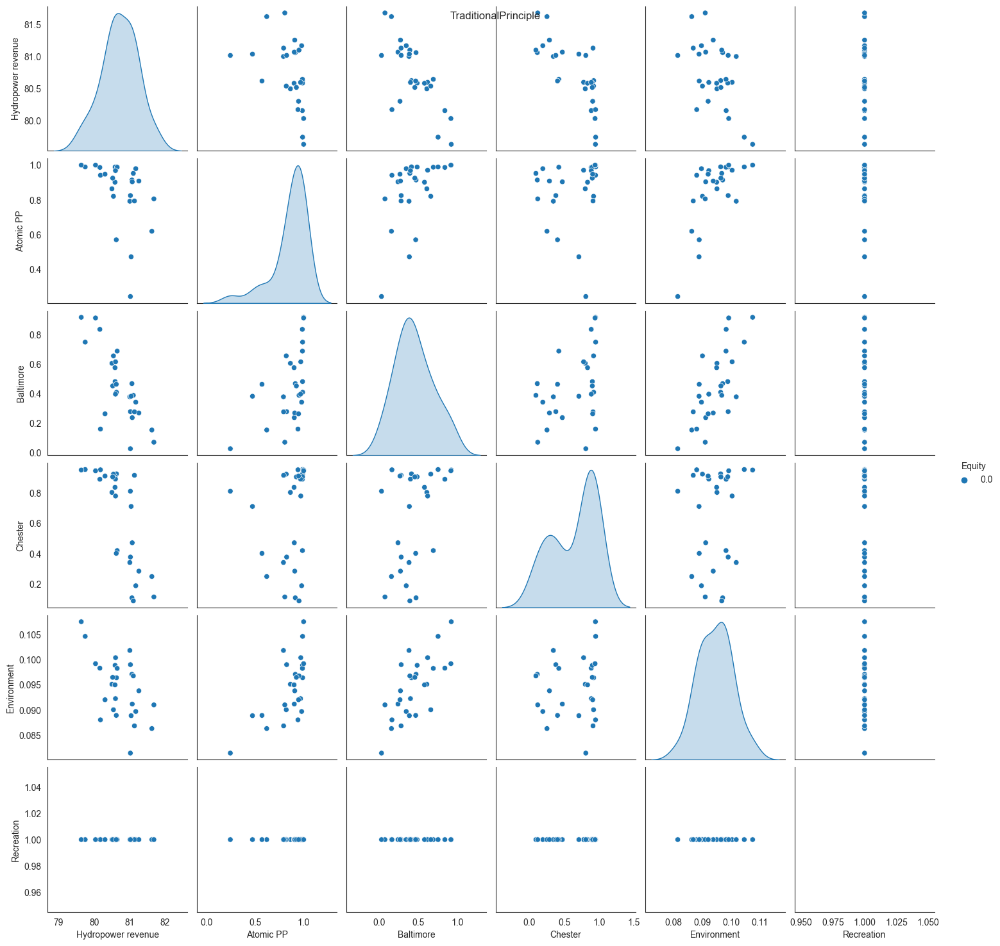

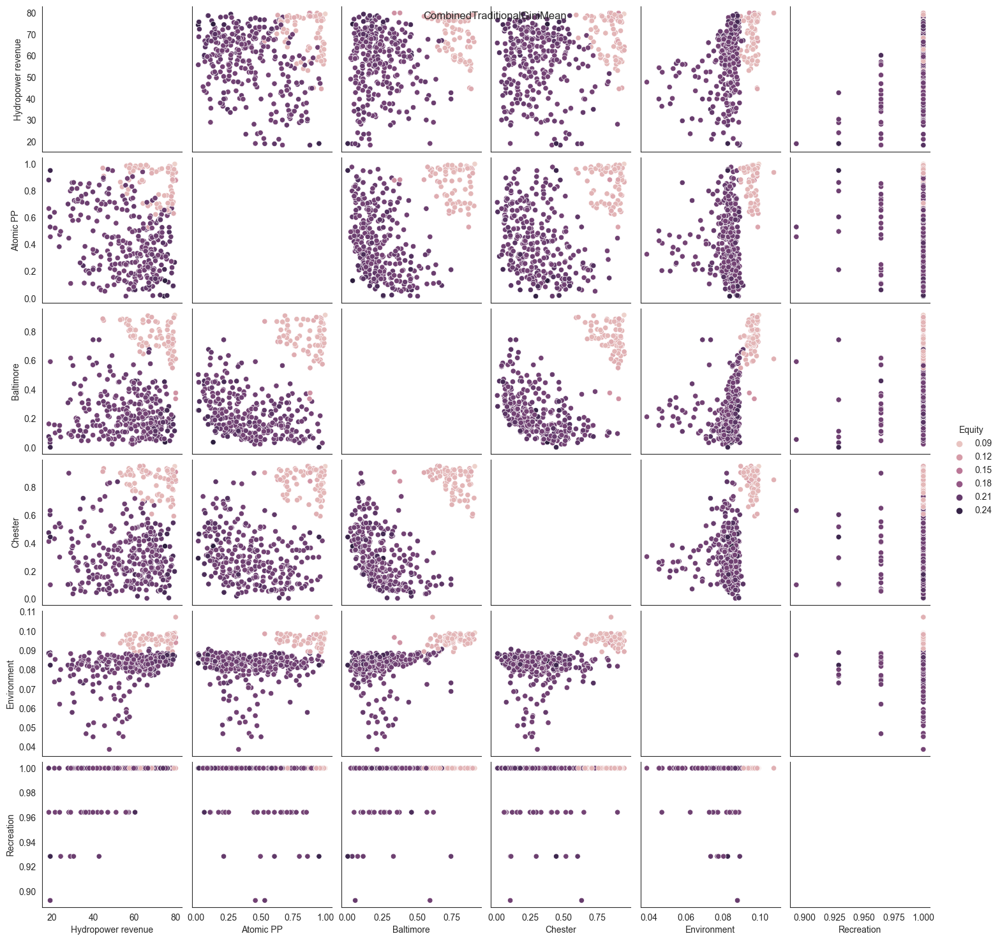

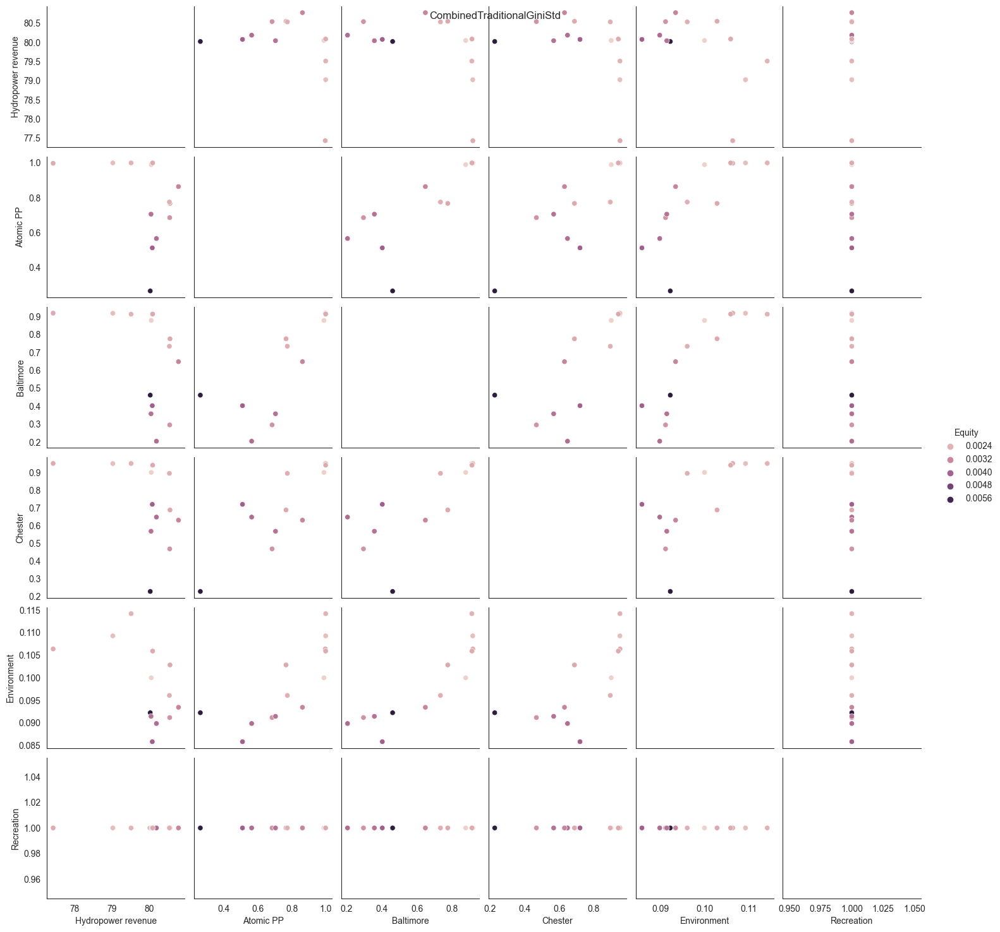

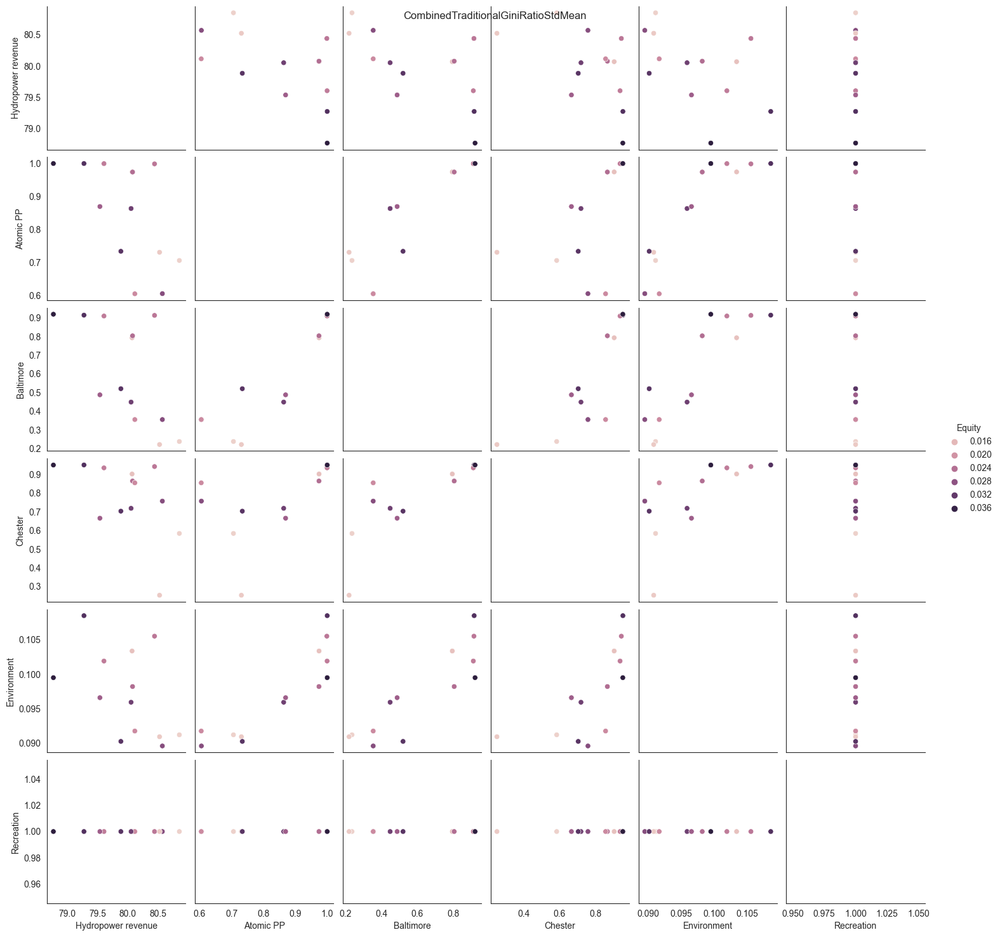

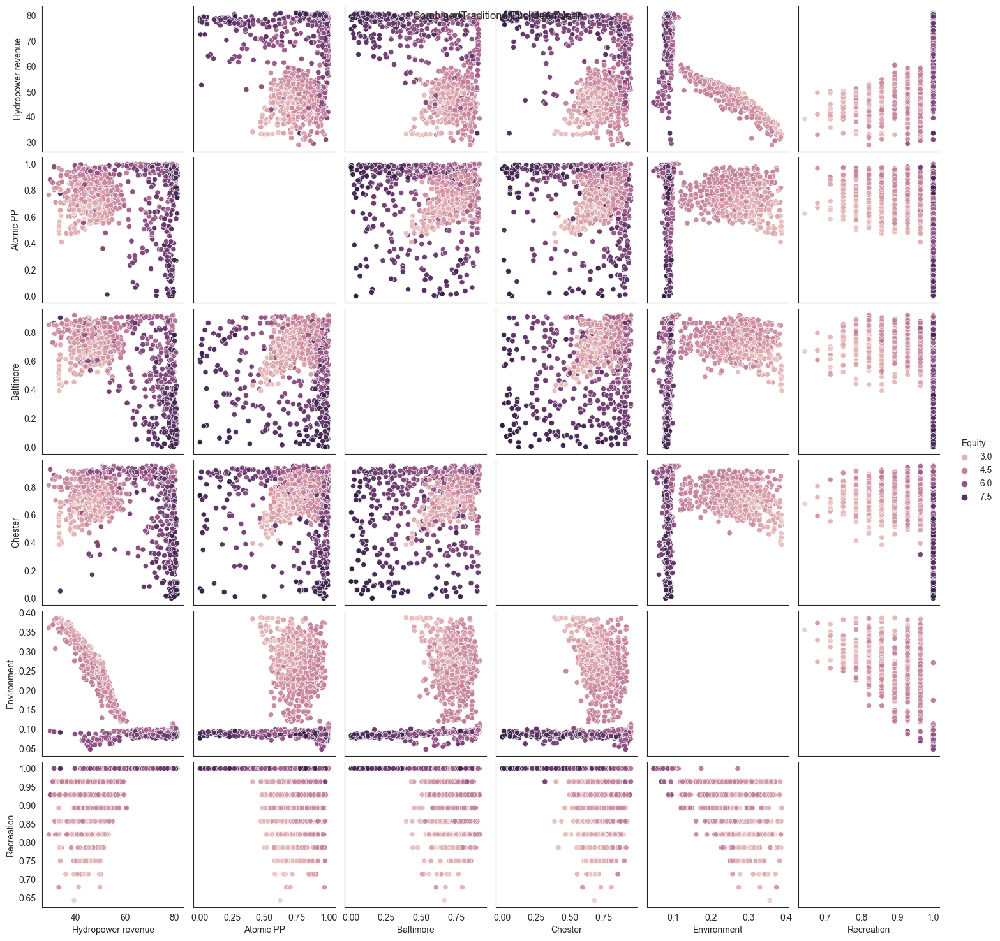

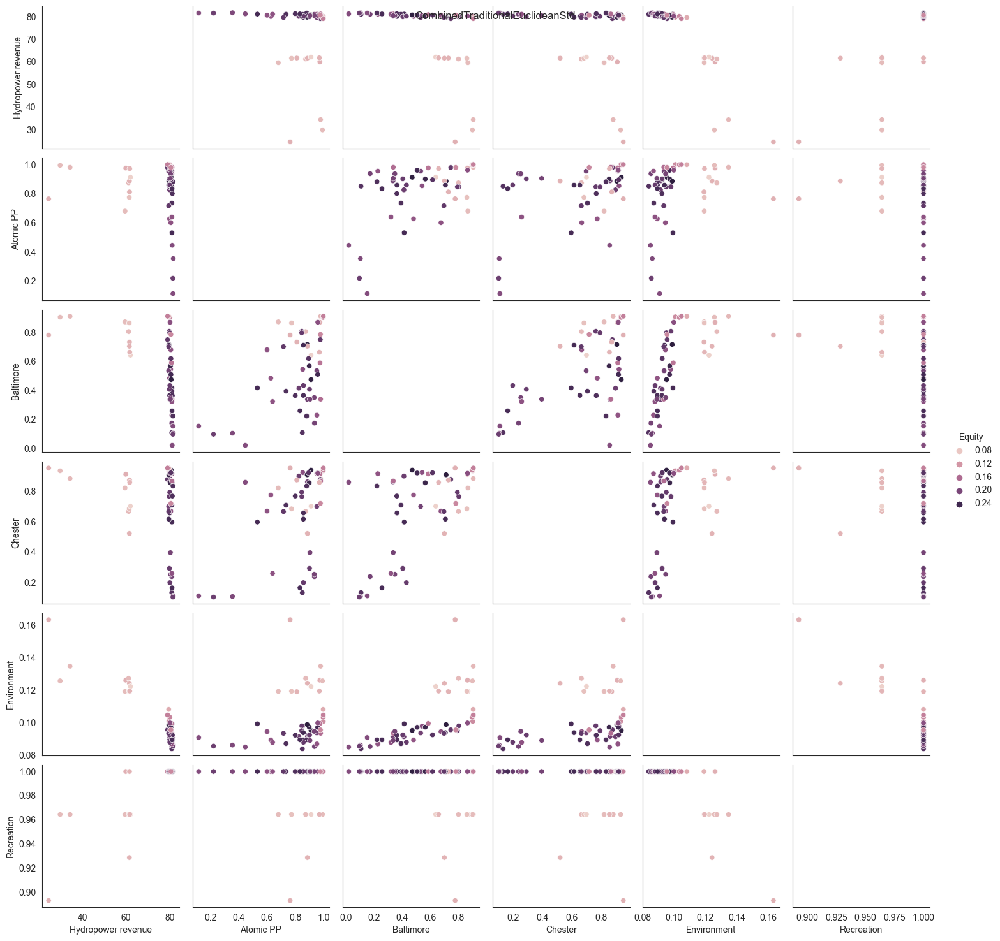

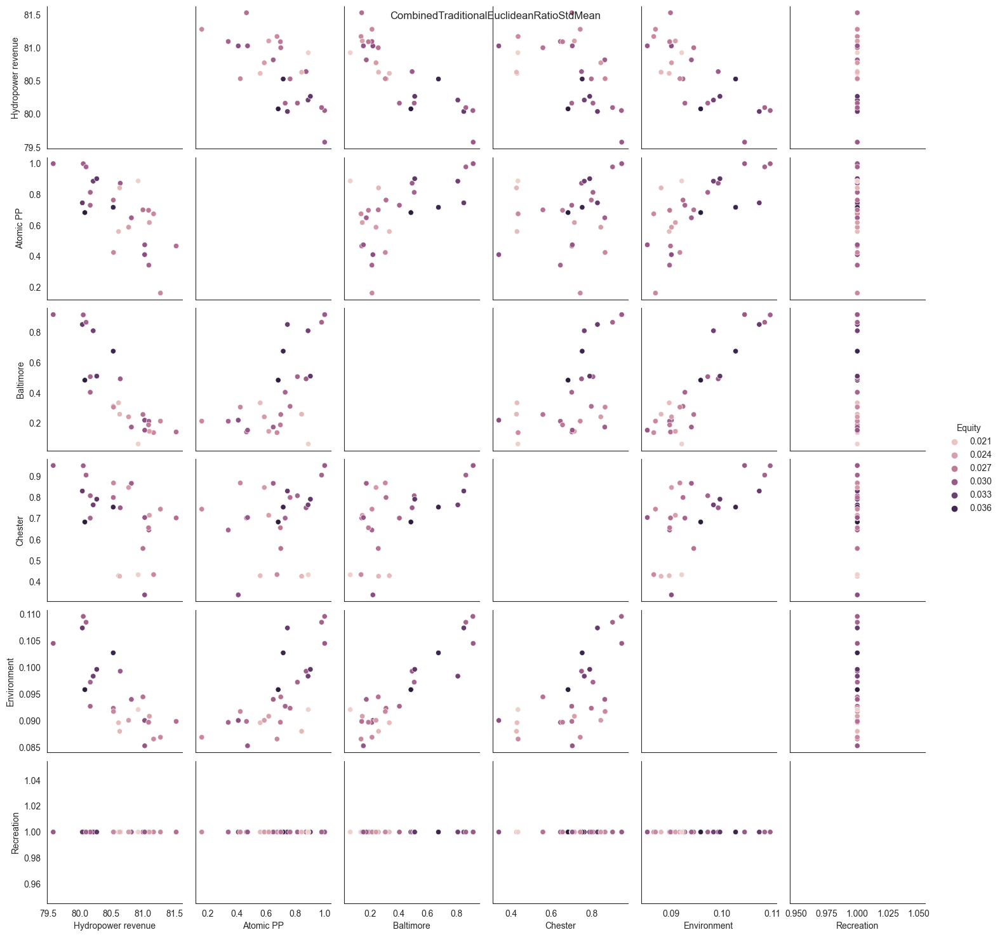

In [640]:
# for the different principles except traditional

for i in dict_principles_objectives:
    g = sns.pairplot(dict_principles_objectives[i], kind = 'scatter', hue = 'Equity')
    g.fig.suptitle(i)
    plt.show()

## Trade-off visualization

### Traditional gini mean

In [49]:
import random

best_obj_indices_traditional = dict()
directions = ["max", "max", "max", "max", "min", "max", "min"]
df_traditional_gini_mean = dict_traditional_inequality_metrics_separate['gini_yearly_mean_coeff']

for i, obj in enumerate(df_traditional_gini_mean):
    if i<7: # remove principle
        if (directions[i] == "min"):
            indexes = df_traditional_gini_mean.loc[df_traditional_gini_mean[obj] == df_traditional_gini_mean[obj].min(), :].index
        elif (directions[i] == "max"):
            indexes = df_traditional_gini_mean.loc[df_traditional_gini_mean[obj] == df_traditional_gini_mean[obj].max(), :].index
        else:
            print("issue with directions!")

        best_obj_indices_traditional[obj] = indexes
    
worst_obj_indices_traditional = dict()
directions = ["max", "max", "max", "max", "min", "max", "min"]

for i, obj in enumerate(df_traditional_gini_mean):
    if i<7: # remove principle
        if (directions[i] == "min"):
            indexes = df_traditional_gini_mean.loc[df_traditional_gini_mean[obj] == df_traditional_gini_mean[obj].max(), :].index
        elif (directions[i] == "max"):
            indexes = df_traditional_gini_mean.loc[df_traditional_gini_mean[obj] == df_traditional_gini_mean[obj].min(), :].index
        else:
            print("issue with directions!")

        worst_obj_indices_traditional[obj] = random.choice(indexes)
        
        
# remove multiple optimal values

# loop through the dictionary and convert the Int64Index to a list and make a random choice
for key, value in best_obj_indices_traditional.items():
    if isinstance(value, pd.Int64Index):
        best_obj_indices_traditional[key] = random.choice(value.tolist())
        
# for key, value in best_obj_indices_traditional.items():
#     if isinstance(value, list):  # check if the value is a list
#         best_obj_indices_traditional[key] = random.choice(value)
#     else:
#         best_obj_indices_traditional[key] = value

for key, value in worst_obj_indices_traditional.items():
    if isinstance(value, pd.Int64Index):
        best_obj_indices_traditional[key] = random.choice(value.tolist())
        
best_values_traditional_gini_mean = dict()
worst_values_traditional_gini_mean = dict()

dict_names_best = ['Best Hydropower Revenue','Best Atomic','Best Baltimore', 'Best Chester','Best Environment','Best Recreation','Best Equity']
dict_names_worst = ['Worst Hydropower Revenue','Worst Atomic','Worst Baltimore', 'Worst Chester','Worst Environment','Worst Recreation','Worst Equity']

for i, (key, value) in enumerate(best_obj_indices_traditional.items()):    
    best_values_traditional_gini_mean[dict_names_best[i]] = df_traditional_gini_mean.loc[value]

for i, (key, value) in enumerate(worst_obj_indices_traditional.items()):    
    worst_values_traditional_gini_mean[dict_names_worst[i]] = df_traditional_gini_mean.loc[value]

best_values_traditional_gini_mean = pd.DataFrame(best_values_traditional_gini_mean).T
worst_values_traditional_gini_mean = pd.DataFrame(worst_values_traditional_gini_mean).T
        

/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_38995/1105263852.py:35: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  if isinstance(value, pd.Int64Index):
/var/folders/fb/0thbs3j11t5f5j12jp7nctzw0000gn/T/ipykernel_38995/1105263852.py:39: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  if isinstance(value, pd.Int64Index):


<Figure size 2000x3000 with 0 Axes>

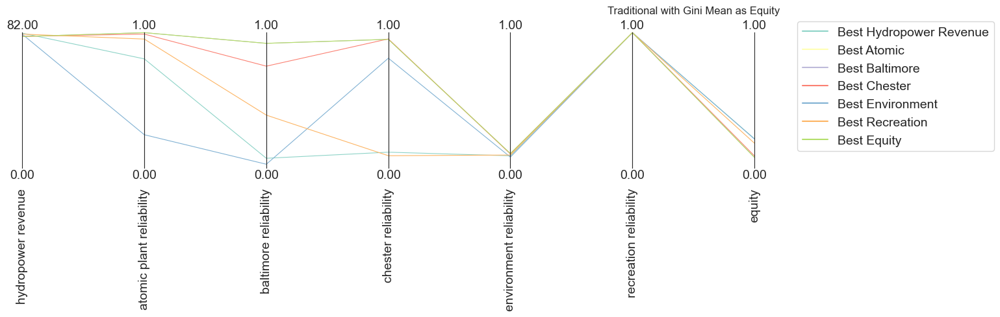

In [53]:
import matplotlib.pyplot as plt
# # from ema_workbench.analysis import get_limits
# from pandas.plotting import parallel_coordinates
# from ema_workbench.analysis.parcoords import ParallelAxes, get_limits


limits = get_limits(best_values_traditional_gini_mean)
limits.loc[0] = [0,0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1,1]
limits = limits.astype(float)
# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()
colors = sns.color_palette("Set3", n_colors=len(best_values_traditional_gini_mean))


# # for (k,v), c in zip(best_values_traditional_gini_mean.items(), sns.color_palette()):

i = 0
j = 0

# Define the number of colors needed in each list
num_colors = 7 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]


for index, row in best_values_traditional_gini_mean.iterrows():
    axes.plot(row[:] , color=colors[i % len(color_list1)], label = index, lw=0.8, alpha=1)
    i += 1

# add legend
plt.title("Traditional with Gini Mean as Equity")
axes.legend()
plt.show()




<Figure size 2000x3000 with 0 Axes>

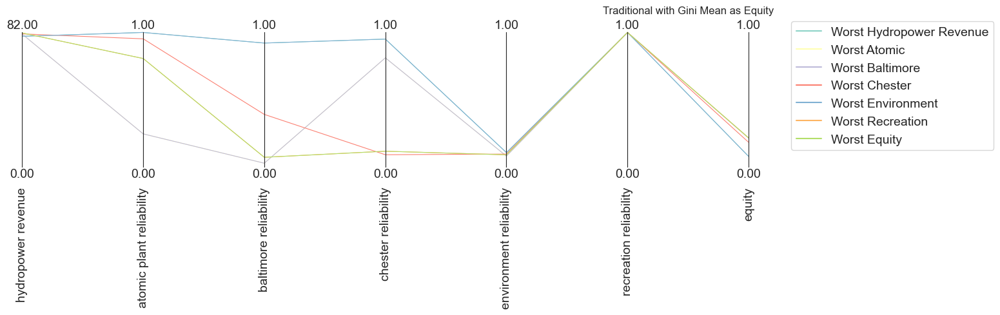

In [54]:
limits = get_limits(worst_values_traditional_gini_mean)
limits.loc[0] = [0,0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()
colors = sns.color_palette("Set3", n_colors=len(best_values_traditional_gini_mean))

# for (k,v), c in zip(best_values_traditional_gini_mean.items(), sns.color_palette()):

j = 0

# Define the number of colors needed in each list
num_colors = 7 # objectives
color_list2 = plt.cm.Dark2.colors[:num_colors]


for index, row in worst_values_traditional_gini_mean.iterrows():
    axes.plot(row[:] , color=colors[j % len(color_list2)], label = index, lw=0.8, alpha=1)
    j += 1

# add legend
plt.title("Traditional with Gini Mean as Equity")
axes.legend()
plt.show()




## Plotting all formulations


In [817]:
df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]]
df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]]
df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]]
df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]]
df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]]
df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]]
df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]]

new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Equity']

df_gini_mean_full_set.columns = new_columns
df_gini_std_full_set.columns = new_columns
df_gini_ratio_full_set.columns = new_columns
df_eucli_mean_full_set.columns = new_columns
df_eucli_std_full_set.columns = new_columns
df_eucli_ratio_full_set.columns = new_columns
df_traditional_full_set.columns = new_columns

df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6]).abs()
df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[:,0:6]).abs()
df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6]).abs()
df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6]).abs()
df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6]).abs()
df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[:,0:6]).abs()

<Figure size 2000x3000 with 0 Axes>

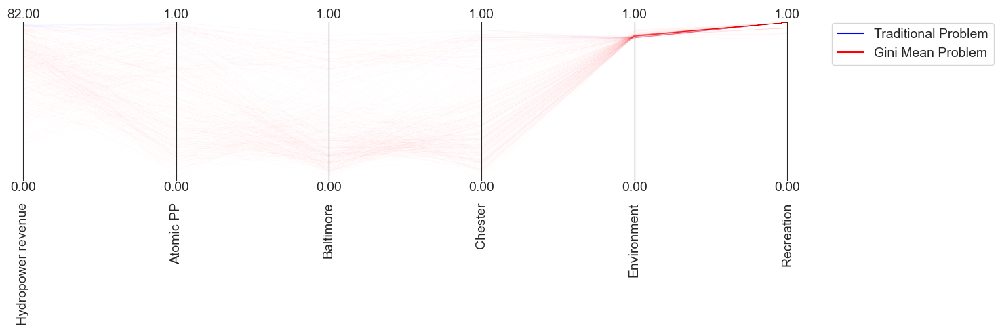

In [818]:

limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()
colors = sns.color_palette("Set3", n_colors=len(df_traditional))

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]


indexes = ['Traditional Problem','Gini Mean Problem']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_gini_mean, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

In [819]:
print(len(df_traditional))
print(len(df_gini_mean))

28
379


<Figure size 2000x3000 with 0 Axes>

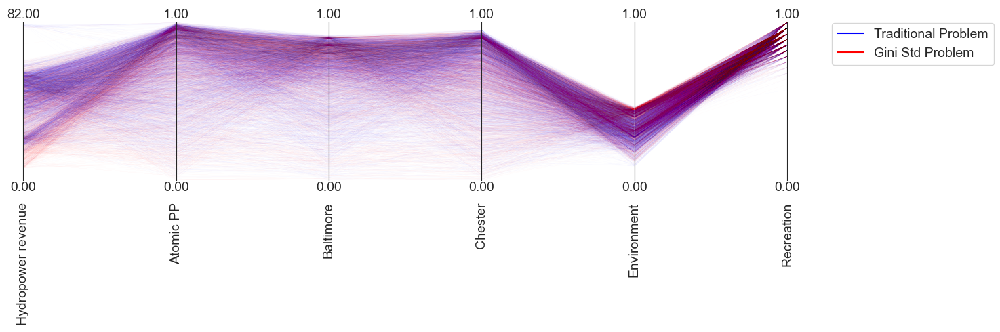

In [724]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]


indexes = ['Traditional Problem','Gini Std Problem']

axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_gini_std, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

In [671]:
print(len(df_traditional))
print(len(df_gini_std))

4113
3369


<Figure size 2000x3000 with 0 Axes>

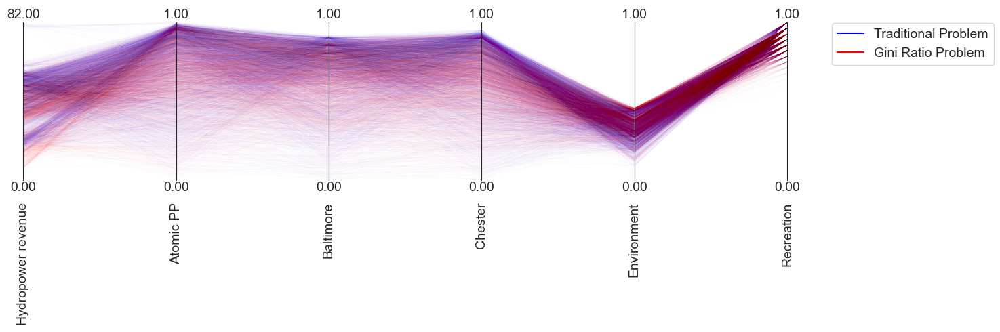

In [725]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]


indexes = ['Traditional Problem','Gini Ratio Problem']

axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_gini_ratio, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

In [673]:
print(len(df_traditional))
print(len(df_gini_ratio))

4113
4518


<Figure size 2000x3000 with 0 Axes>

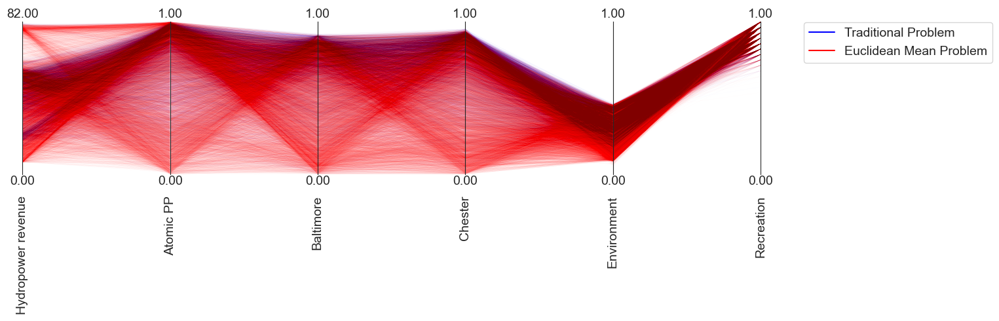

In [726]:

limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]


indexes = ['Traditional Problem','Euclidean Mean Problem']

axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_eucli_mean, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

In [675]:
print(len(df_traditional))
print(len(df_eucli_mean))

4113
21041


<Figure size 2000x3000 with 0 Axes>

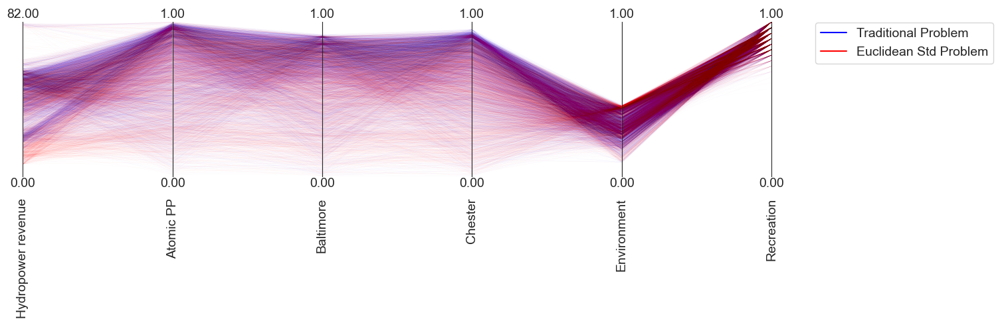

In [727]:
df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6])
df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6])
df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6])
df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6])
df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6])

limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['Traditional Problem','Euclidean Std Problem']

axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_eucli_std, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

KeyError: "None of [Index(['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester',\n       'Environment', 'Recreation'],\n      dtype='object')] are in the [columns]"

<Figure size 2000x3000 with 0 Axes>

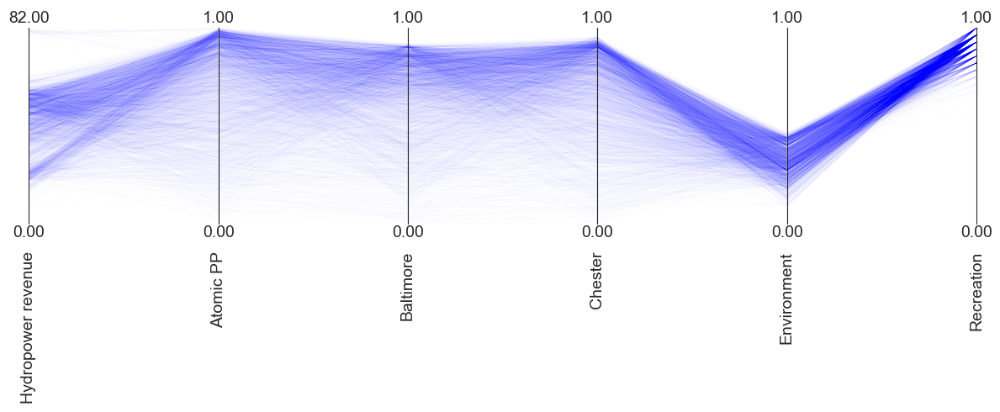

In [780]:
df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6])
df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[:,0:6])
df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[:,0:6])
df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[:,0:6])
df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[:,0:6])

limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,1,0]
limits.loc[1] = [82,1,1,1,0,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['Traditional Problem','Euclidean Ratio Problem']

axes.plot(df_traditional, color= 'b', label = indexes[0], lw=0.05, alpha=0.1)
axes.plot(df_eucli_ratio, color= 'r', label = indexes[1], lw=0.05, alpha=0.1)

axes.legend()

## Try visualizing trade-off with a smaller dataset, the 5 best equity values, and for traditional the 5 highest revenue values

In [678]:
ethical_formulations

['TraditionalPrinciple',
 'CombinedTraditionalGiniMean',
 'CombinedTraditionalGiniStd',
 'CombinedTraditionalGiniRatioStdMean',
 'CombinedTraditionalEuclideanMean',
 'CombinedTraditionalEuclideanStd',
 'CombinedTraditionalEuclideanRatioStdMean']

In [679]:
# df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:].sort_values(by = 'equity', ascending = False).abs()
# df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]].sort_values(by = 'hydropower revenue', ascending = False).abs()

# new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Equity']

# df_gini_mean_full_set.columns = new_columns
# df_gini_std_full_set.columns = new_columns
# df_gini_ratio_full_set.columns = new_columns
# df_eucli_mean_full_set.columns = new_columns
# df_eucli_std_full_set.columns = new_columns
# df_eucli_ratio_full_set.columns = new_columns
# df_traditional_full_set.columns = new_columns

# df_traditional = pd.DataFrame(df_traditional_full_set.iloc[0:5,0:6]).abs()
# df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[0:5,0:6]).abs()
# df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[0:5,0:6]).abs()
# df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[0:5,0:6]).abs()
# df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[0:5,0:6]).abs()
# df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[0:5,0:6]).abs()
# df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[0:5,0:6]).abs()

In [820]:
df_gini_mean_full_set = dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_gini_std_full_set = dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_gini_ratio_full_set = dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_eucli_mean_full_set = dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_eucli_std_full_set = dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_eucli_ratio_full_set = dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:].sort_values(by = 'Equity', ascending = False).abs()
df_traditional_full_set = dict_principles_objectives[ethical_formulations[0]].sort_values(by = 'Hydropower revenue', ascending = False).abs()

df_traditional = pd.DataFrame(df_traditional_full_set.iloc[0:5,0:6]).abs()
df_gini_mean = pd.DataFrame(df_gini_mean_full_set.iloc[0:5,0:6]).abs()
df_gini_std = pd.DataFrame(df_gini_std_full_set.iloc[0:5,0:6]).abs()
df_gini_ratio = pd.DataFrame(df_gini_ratio_full_set.iloc[0:5,0:6]).abs()
df_eucli_mean = pd.DataFrame(df_eucli_mean_full_set.iloc[0:5,0:6]).abs()
df_eucli_std = pd.DataFrame(df_eucli_std_full_set.iloc[0:5,0:6]).abs()
df_eucli_ratio = pd.DataFrame(df_eucli_ratio_full_set.iloc[0:5,0:6]).abs()


<Figure size 4000x3000 with 0 Axes>

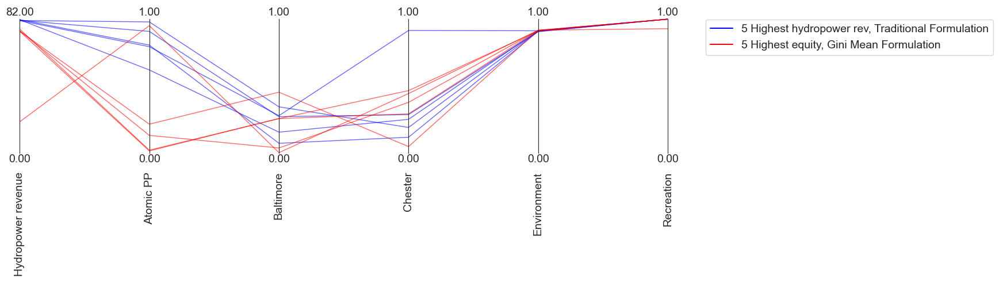

In [821]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Mean Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_gini_mean, color= 'r', label = indexes[1], lw=1, alpha=0.6)
# for index, row in worst_values_traditional_gini_mean.iterrows():
#     axes.plot(row[:] , color=colors[j % len(color_list2)], label = index, lw=0.8, alpha=1)
#     j += 1

axes.legend()
plt.show()


<Figure size 2000x3000 with 0 Axes>

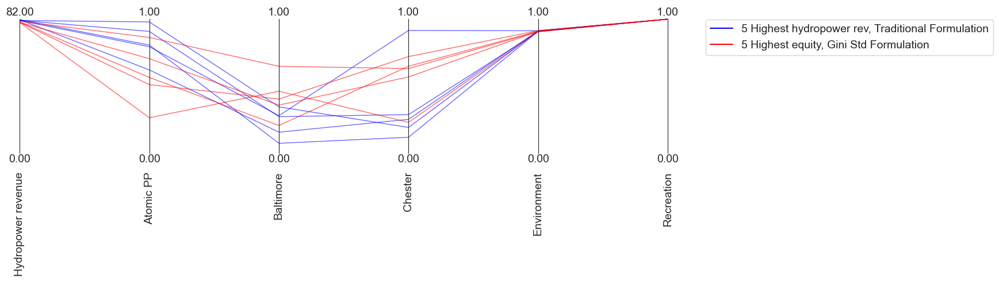

In [822]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Std Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_gini_std, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


<Figure size 2000x3000 with 0 Axes>

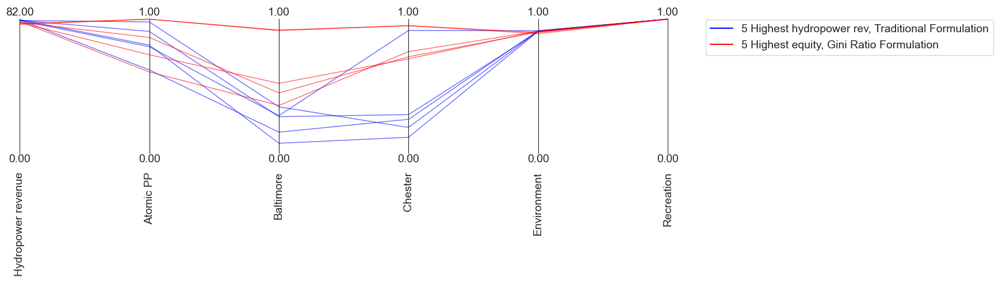

In [823]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 30))

axes = ParallelAxes(limits)

sns.color_palette()

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Gini Ratio Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_gini_ratio, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


<Figure size 4000x3000 with 0 Axes>

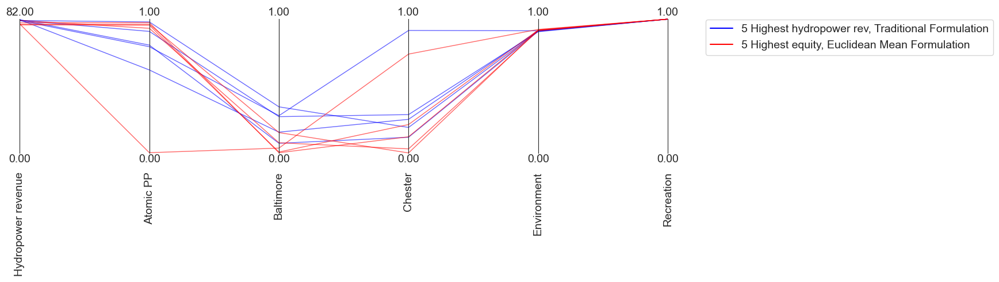

In [824]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Euclidean Mean Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_eucli_mean, color= 'r', label = indexes[1], lw=1, alpha=0.6)

axes.legend()
plt.show()


<Figure size 4000x3000 with 0 Axes>

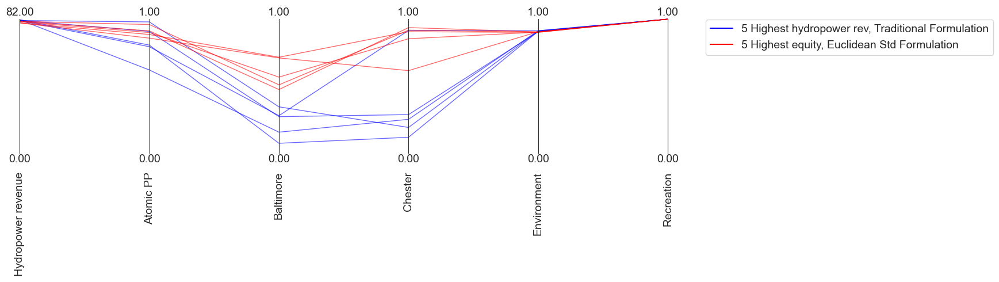

In [825]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Euclidean Std Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_eucli_std, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


<Figure size 4000x3000 with 0 Axes>

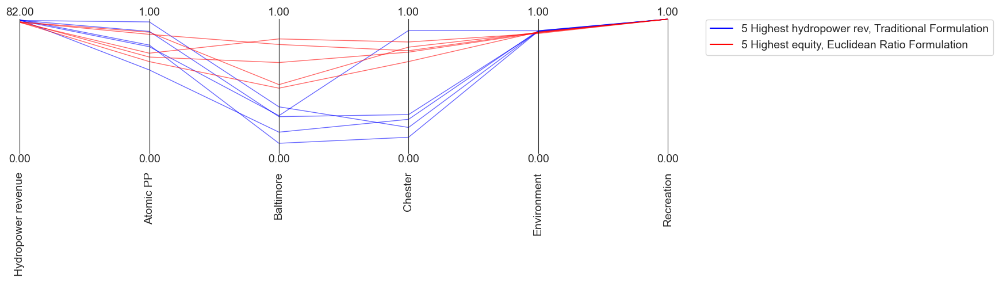

In [826]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 Highest hydropower rev, Traditional Formulation','5 Highest equity, Euclidean Ratio Formulation']
axes.plot(df_traditional, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(df_eucli_ratio, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


## Try visualizing trade-off with a smaller dataset, the 5 equity values around the median, and for traditional the 5 highest revenue values

In [827]:
df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
df_gini_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]).abs()
df_gini_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]).abs()
df_gini_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]).abs()

df_eucli_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]).abs()
df_eucli_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]).abs()
df_eucli_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]).abs()

In [828]:
def get_median(df, median_column, threshold):
    
    median = df[median_column].median()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[median_column] - median)
    df_diff = pd.DataFrame(diff)
    df_diff = df_diff.sort_values(by = median_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]


    return df_final

def get_max(df, max_column, threshold):   
    max_value = df[max_column].max()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[max_column] - max_value)
    df_diff = pd.DataFrame(diff)
    df_diff = df_diff.sort_values(by = max_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]

    return df_final

def get_min(df, min_column, threshold):
    min_value = df[min_column].min()

    # calculate the absolute difference between each value in column x and the median
    diff = abs(df[min_column] - min_value)
    df_diff = pd.DataFrame(diff)
    df_diff = df_diff.sort_values(by = min_column, ascending = True)
    
    # get the index of the row with the smallest absolute difference
    df_diff_indexes = df_diff.iloc[:threshold,:].index
    df_final = df.iloc[df_diff_indexes,:]

    return df_final

In [829]:
# adapt later
# gini_mean_median_equity = get_median(df_gini_mean, 'equity',5)
# gini_std_median_equity =  get_median(df_gini_std, 'equity',5)
# gini_ratio_median_equity =  get_median(df_gini_ratio, 'equity',5)
# eucli_mean_median_equity =  get_median(df_eucli_mean, 'equity',5)
# eucli_std_median_equity =  get_median(df_eucli_std, 'equity',5)
# eucli_ratio_median_equity =  get_median(df_eucli_ratio, 'equity',5)
# traditional_median_equity =  get_median(df_traditional, 'hydropower revenue',5)

gini_mean_median_equity = get_median(df_gini_mean, 'Equity',5)
gini_std_median_equity =  get_median(df_gini_std, 'Equity',5)
gini_ratio_median_equity =  get_median(df_gini_ratio, 'Equity',5)
eucli_mean_median_equity =  get_median(df_eucli_mean, 'Equity',5)
eucli_std_median_equity =  get_median(df_eucli_std, 'Equity',5)
eucli_ratio_median_equity =  get_median(df_eucli_ratio, 'Equity',5)
traditional_median_equity =  get_median(df_traditional, 'Hydropower revenue',5)


<Figure size 2000x1500 with 0 Axes>

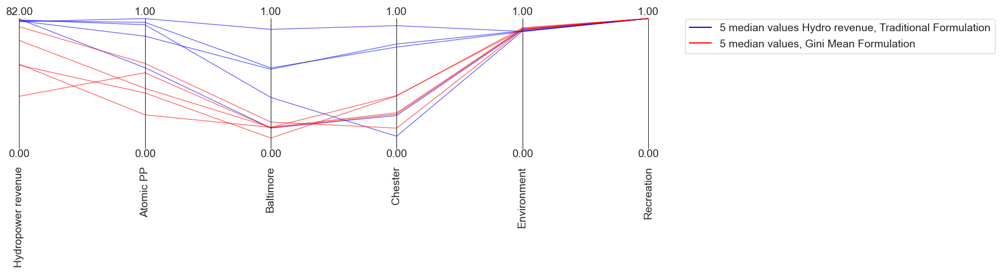

In [830]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(20, 15))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values Hydro revenue, Traditional Formulation','5 median values, Gini Mean Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(gini_mean_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


<Figure size 4000x3000 with 0 Axes>

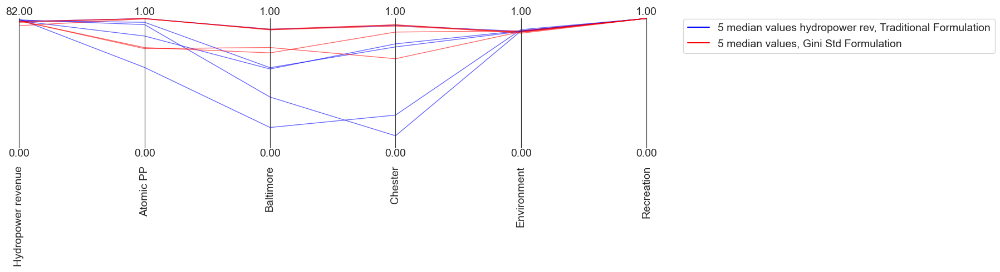

In [831]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Gini Std Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(gini_std_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()


<Figure size 4000x3000 with 0 Axes>

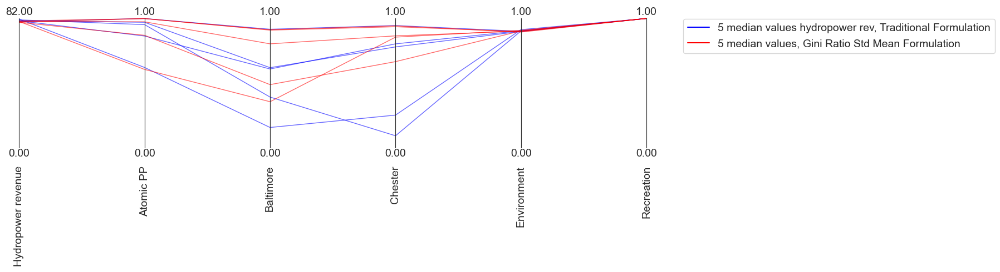

In [832]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Gini Ratio Std Mean Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(gini_ratio_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()

<Figure size 4000x3000 with 0 Axes>

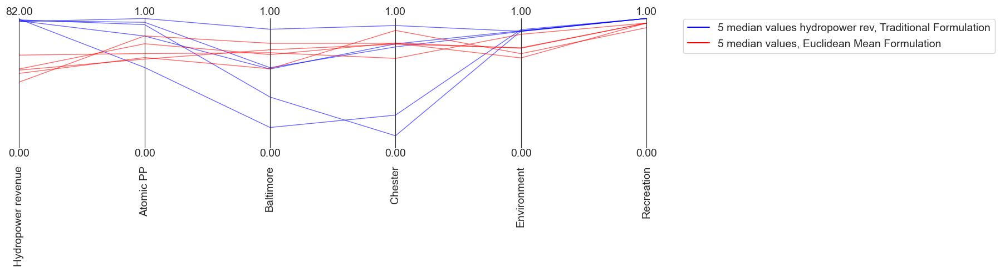

In [833]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Mean Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(eucli_mean_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()

<Figure size 4000x3000 with 0 Axes>

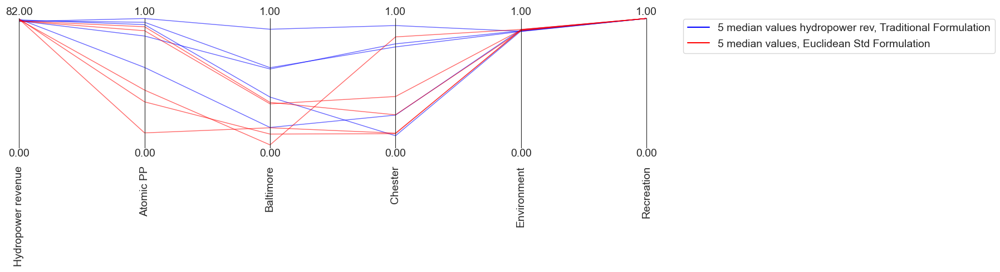

In [834]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Std Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(eucli_std_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()

<Figure size 4000x3000 with 0 Axes>

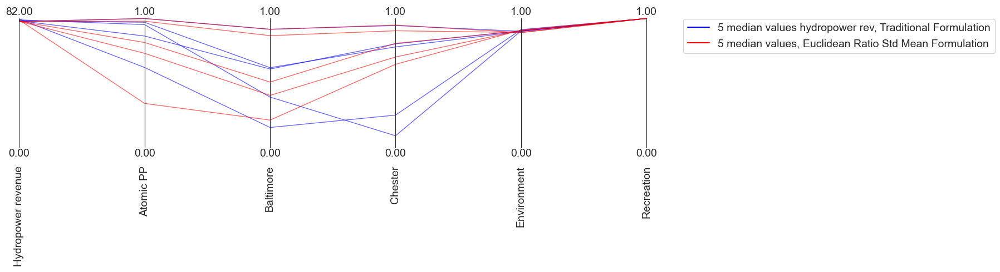

In [835]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Ratio Std Mean Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(eucli_ratio_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()

# Min, Max, Median of each formulation

In [845]:
df_traditional = pd.DataFrame(df_traditional_full_set.iloc[:,0:6]).abs()
df_gini_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[1]].iloc[:,-7:]).abs()
df_gini_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[2]].iloc[:,-7:]).abs()
df_gini_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[3]].iloc[:,-7:]).abs()

df_eucli_mean = pd.DataFrame(dict_principles_objectives[ethical_formulations[4]].iloc[:,-7:]).abs()
df_eucli_std = pd.DataFrame(dict_principles_objectives[ethical_formulations[5]].iloc[:,-7:]).abs()
df_eucli_ratio = pd.DataFrame(dict_principles_objectives[ethical_formulations[6]].iloc[:,-7:]).abs()

df_list = []

In [846]:
dict_principles_objectives[ethical_formulations[1]]

,Hydropower revenue,Atomic PP,Baltimore,Chester,Environment,Recreation,Equity
0,35.975495,0.386671,0.472916,0.052773,0.914519,1.000000,0.203448
1,42.691207,0.654834,0.307176,0.066607,0.917801,1.000000,0.208849
2,42.978255,0.078265,0.500715,0.313760,0.911196,1.000000,0.202862
3,67.862882,0.613083,0.286558,0.120480,0.917909,1.000000,0.200286
4,54.483913,0.350398,0.055209,0.611211,0.919011,1.000000,0.203221
...,...,...,...,...,...,...,...
374,39.825798,0.107422,0.571074,0.274621,0.927541,0.964286,0.204190
375,75.279243,0.311851,0.178581,0.268079,0.915752,1.000000,0.206528
376,66.587990,0.232733,0.133249,0.544439,0.917142,1.000000,0.206024
377,72.691324,0.584947,0.233211,0.065211,0.913432,1.000000,0.216662


NameError: name 'df_rbf' is not defined

<Figure size 4000x3000 with 0 Axes>

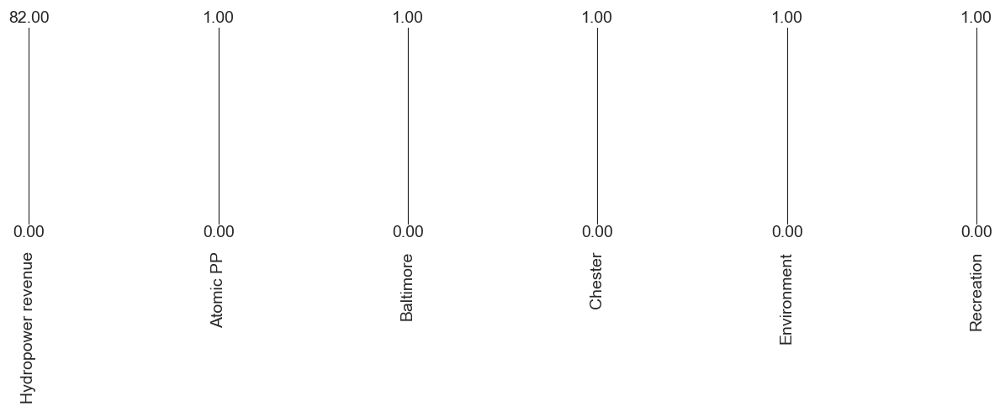

In [847]:
limits = get_limits(df_traditional)
limits.loc[0] = [0,0,0,0,0,0]
limits.loc[1] = [82,1,1,1,1,1]
limits = limits.astype(float)


# Create a new figure with a larger size
plt.figure(figsize=(40, 30))

axes = ParallelAxes(limits)

df_max = pd.concat([df_rbf.loc[i] for i in df_rbf.idxmax()], axis=1).T
df_min = pd.concat([df_rbf.loc[i] for i in df_rbf.idxmin()], axis=1).T

sns.color_palette()

j = 0

# Define the number of colors needed in each list
num_colors = 1 # objectives
color_list1 = plt.cm.Set1.colors[:num_colors]
color_list2 = plt.cm.Dark2.colors[:num_colors]

indexes = ['5 median values hydropower rev, Traditional Formulation','5 median values, Euclidean Std Formulation']
axes.plot(traditional_median_equity, color= 'b', label = indexes[0], lw=1, alpha=0.6)
axes.plot(eucli_std_median_equity, color= 'r', label = indexes[1], lw=1, alpha=0.6)


axes.legend()
plt.show()



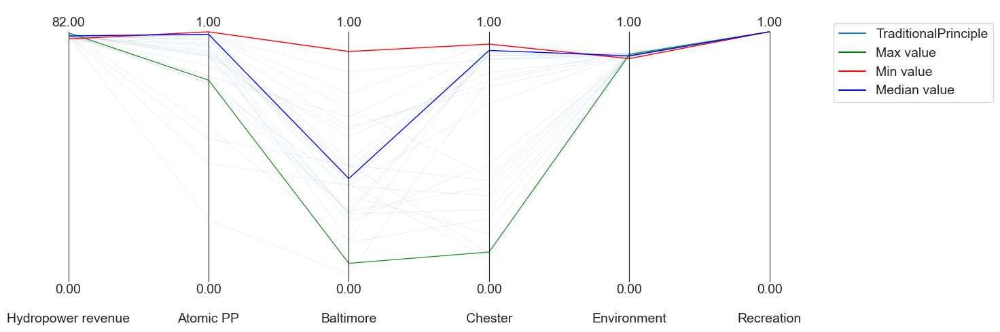

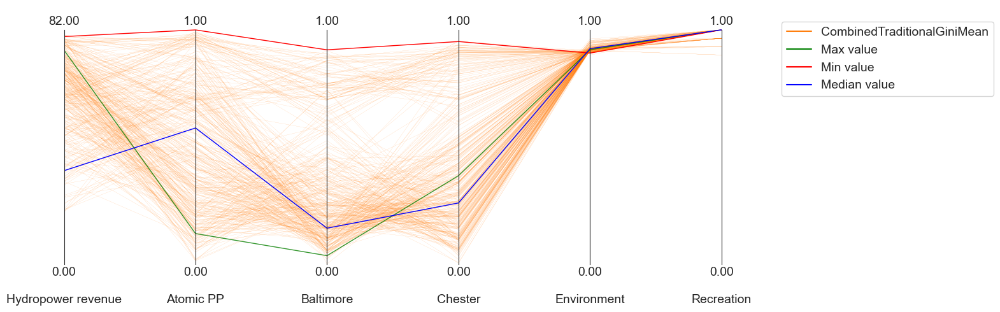

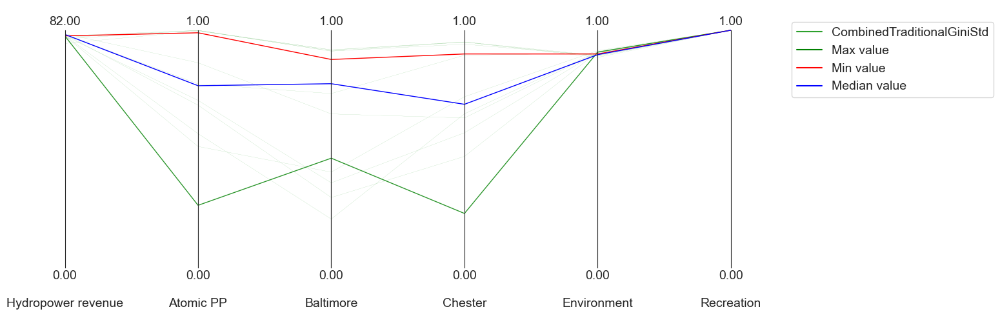

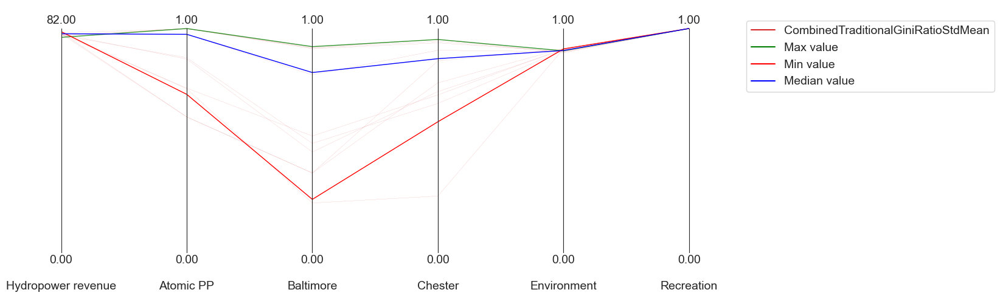

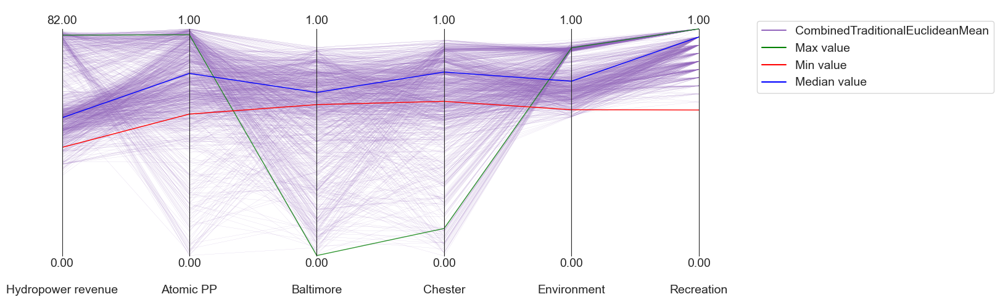

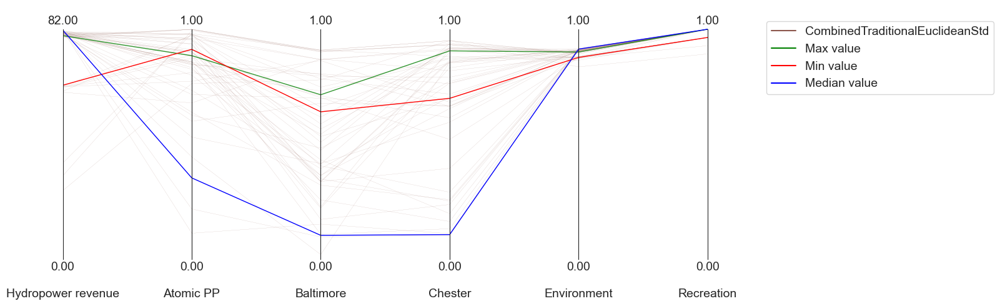

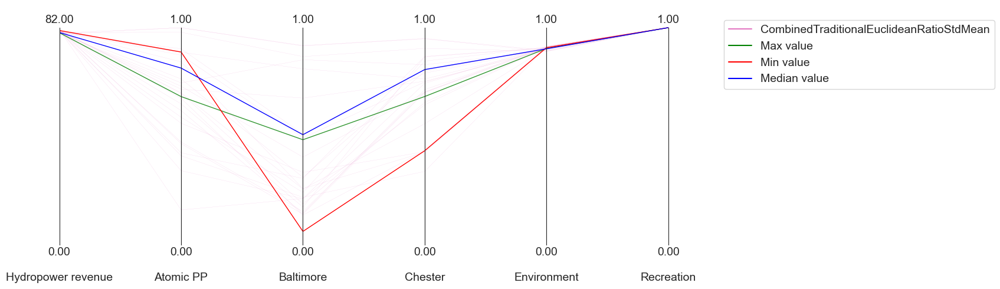

In [854]:
for (k,v), c in zip(dict_principles_objectives.items(), sns.color_palette()):
    df_principle = pd.DataFrame(dict_principles_objectives[k].iloc[:,-7:-1]).abs()
#     df_max = pd.concat([df_principle.loc[i] for i in df_principle.idxmax()], axis=1).T
#     df_min = pd.concat([df_principle.loc[i] for i in df_principle.idxmin()], axis=1).T
    if k == ethical_formulations[0]:
        df_max = get_max(df_principle, 'Hydropower revenue',1)
        df_min = get_min(df_principle, 'Hydropower revenue',1)
        df_median = get_median(df_principle, 'Hydropower revenue',1)
    else:
        df_median = get_median((dict_principles_objectives[k].iloc[:,-7:]).abs(), 'Equity',1)
        df_max = get_max((dict_principles_objectives[k].iloc[:,-7:]).abs(), 'Equity',1)
        df_min = get_min((dict_principles_objectives[k].iloc[:,-7:]).abs(), 'Equity',1)

    limits = get_limits(df_principle)
    limits.loc[0] = [0,0,0,0,0,0]
    limits.loc[1] = [82,1,1,1,1,1]
    axes = ParallelAxes(limits, rot=0)    
    axes.plot(v, label=k, color=c, lw = 0.1, alpha=0.7)
    axes.plot(df_max, label='Max value', lw=1, color='green', alpha=0.8)
    axes.plot(df_min, label='Min value', lw=1, color='red', alpha=1)
    axes.plot(df_median, label='Median value', lw=1, color='blue', alpha=1)
    axes.legend()

# Final Parallel Axis Plots

# Boxplot analysis

In [839]:
# attaching the objective formulation to the output
# combined_obj = pd.concat(dict_principles_objectives.values()) 
# combined_obj['principle'].unique()

# attaching the objective formulation to the output with all inequality metrics
combined_obj_inequality_metrics = pd.concat(dict_principles_all_inequality_metrics.values())

# extract the column 'C' from its original position
c = combined_obj_inequality_metrics.pop('principle')

# insert the column 'C' at the last position
combined_obj_inequality_metrics.insert(len(combined_obj_inequality_metrics.columns), 'principle', c)
# combined_obj_inequality_metrics = combined_obj_inequality_metrics.drop('equity',axis = 1)


In [840]:
# rename all columns

new_columns = ['Hydropower revenue', 'Atomic PP', 'Baltimore', 'Chester', 'Environment', 'Recreation', 'Gini Mean', 'Euclidean Mean', 'Gini Std', 'Euclidean Std', 'Gini Ratio', 'Euclidean Ratio', 'Formulation']

# rename all principles to their experiment name

combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[0], 'F1')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[1], 'F2')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[2], 'F4')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[3], 'F4')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[4], 'F5')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[5], 'F6')
combined_obj_inequality_metrics['principle'] = combined_obj_inequality_metrics['principle'].replace(ethical_formulations[6], 'F7')

combined_obj_inequality_metrics.columns = new_columns


In [841]:
combined_obj_inequality_metrics

,Hydropower revenue,Atomic PP,Baltimore,Chester,Environment,Recreation,Gini Mean,Euclidean Mean,Gini Std,Euclidean Std,Gini Ratio,Euclidean Ratio,Formulation
0,80.160953,0.986482,0.839277,0.889627,0.901678,1.0,0.087628,5.033091,0.001632,0.114181,0.018629,0.022686,F1
1,80.627882,0.989744,0.412153,0.925160,0.903584,1.0,0.119337,6.304591,0.002697,0.145669,0.022604,0.023105,F1
2,79.747738,0.989182,0.752492,0.953622,0.895378,1.0,0.090902,5.205454,0.002167,0.120090,0.023837,0.023070,F1
3,80.500229,0.863893,0.608668,0.803320,0.904872,1.0,0.109219,5.705371,0.002458,0.154682,0.022508,0.027112,F1
4,81.063688,0.914201,0.470852,0.111780,0.902896,1.0,0.176460,7.580843,0.003993,0.222229,0.022631,0.029315,F1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22,80.774164,0.587906,0.241683,0.845973,0.909941,1.0,0.156431,7.045263,0.002835,0.170767,0.018123,0.024239,F7
23,81.528211,0.466322,0.142098,0.702173,0.910143,1.0,0.180185,7.332493,0.004047,0.205261,0.022461,0.027993,F7
24,80.926015,0.887816,0.062618,0.433807,0.907921,1.0,0.188288,7.823884,0.004554,0.157124,0.024187,0.020083,F7
25,81.103050,0.618148,0.146296,0.714757,0.909170,1.0,0.167910,7.172394,0.003854,0.171518,0.022953,0.023914,F7


### With all inequality metrics

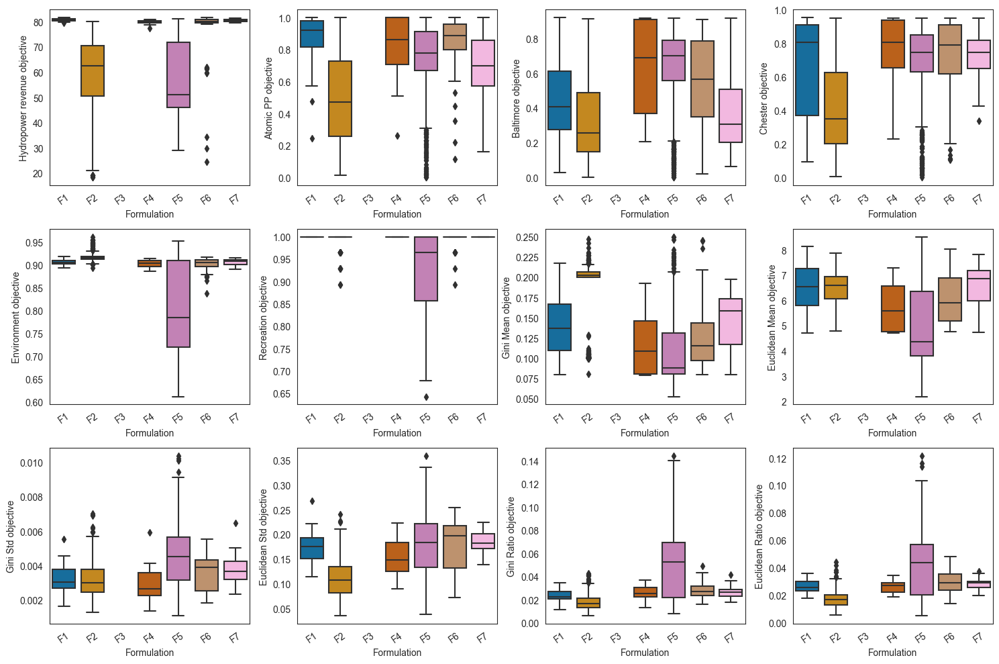

In [842]:
import seaborn as sns

ethical_formulations_experiment_name = ['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7',]
l = []
for n in ethical_formulations_experiment_name:
    l.append(n)

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))

for i, entry in enumerate(combined_obj_inequality_metrics.columns[0:-1]):
    data = combined_obj_inequality_metrics[[entry, 'Formulation']]
    ax = axes[i // 4, i % 4]
    sns.boxplot(data=data, y=entry, x='Formulation', order=l, palette='colorblind', ax=ax)
    ax.set_ylabel(f"{entry} objective")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=35)

plt.tight_layout()
plt.show()

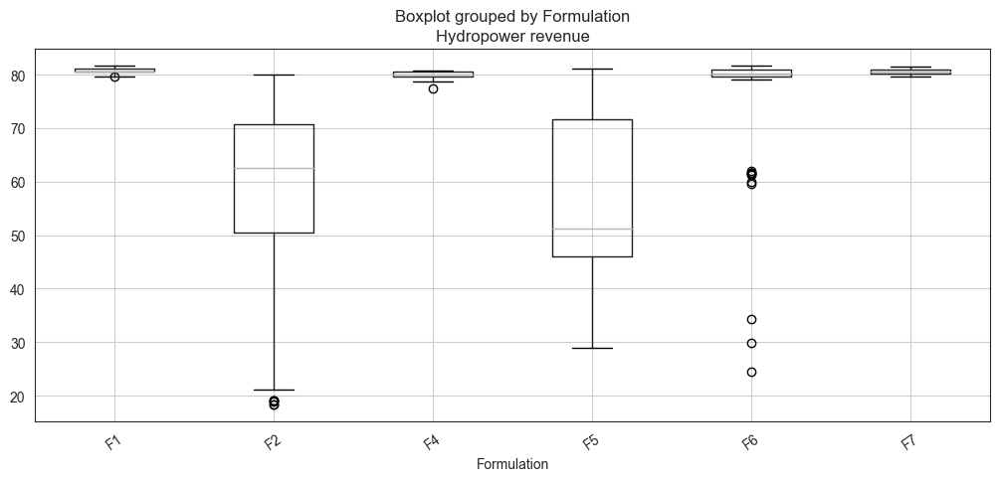

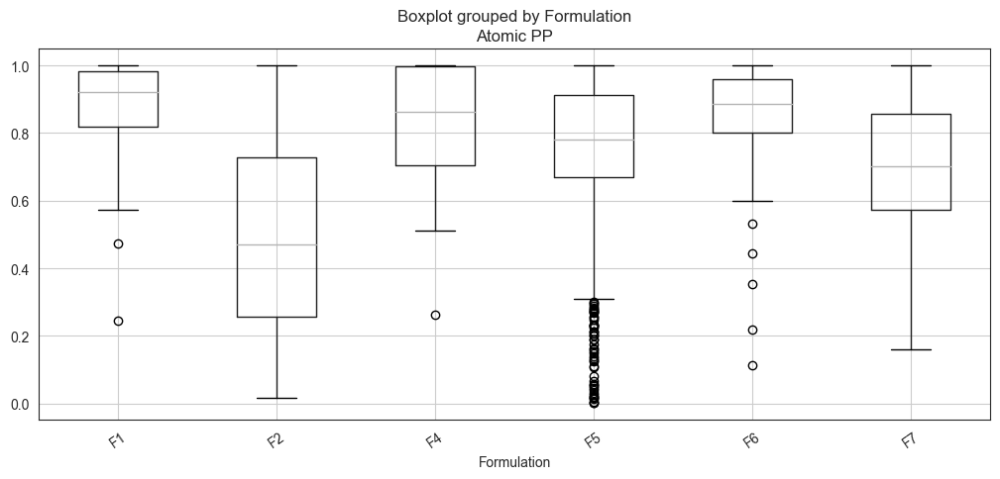

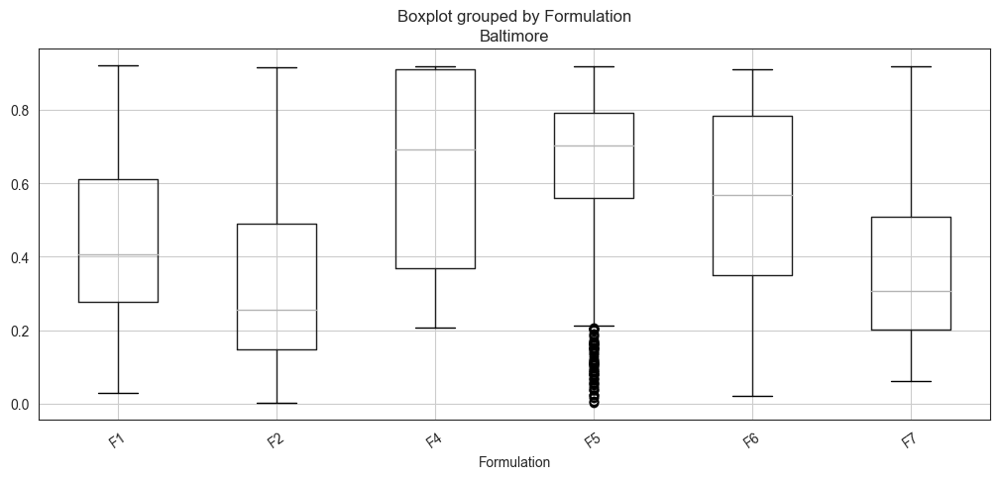

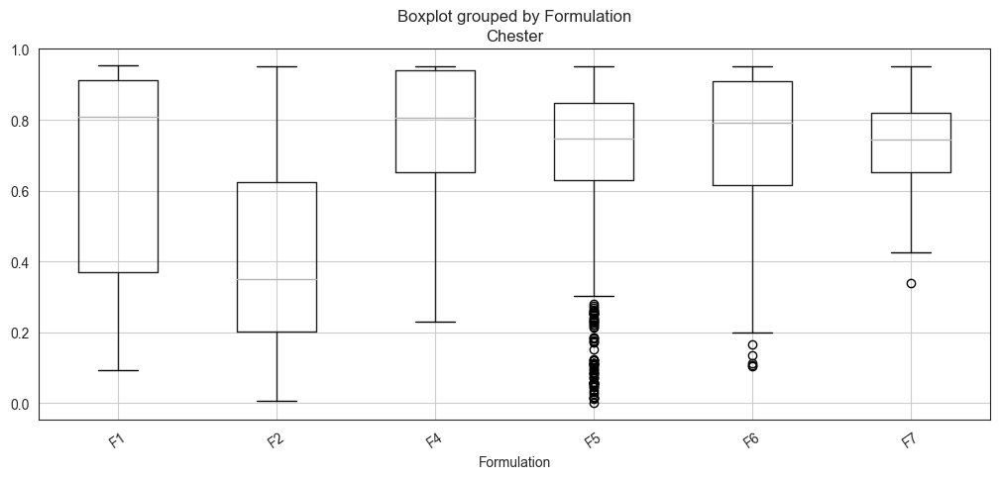

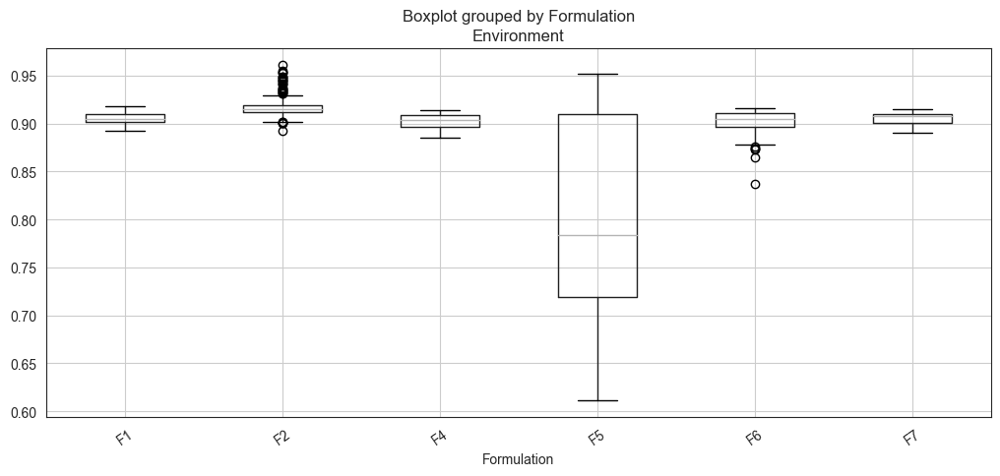

...

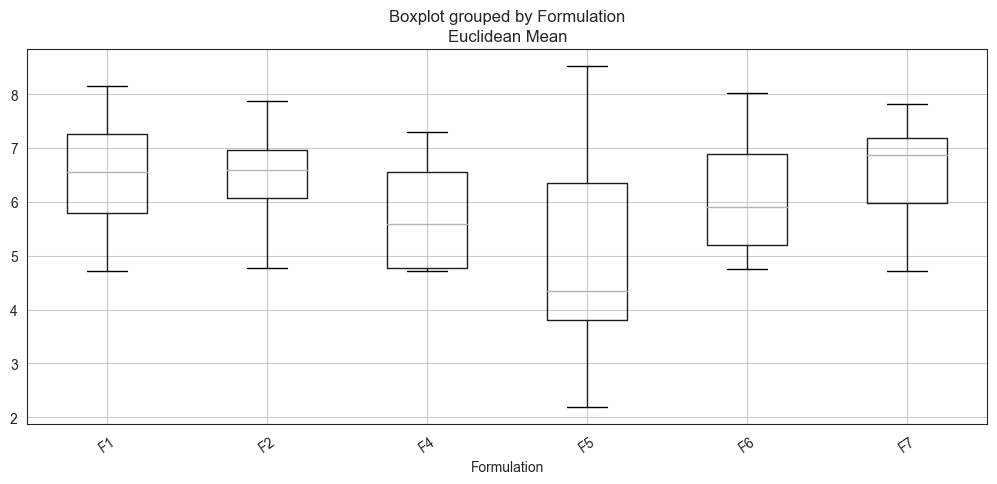

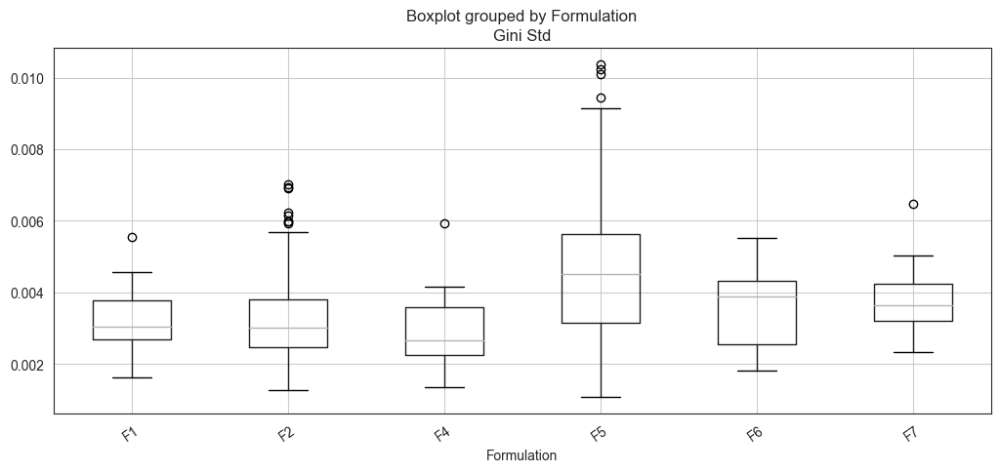

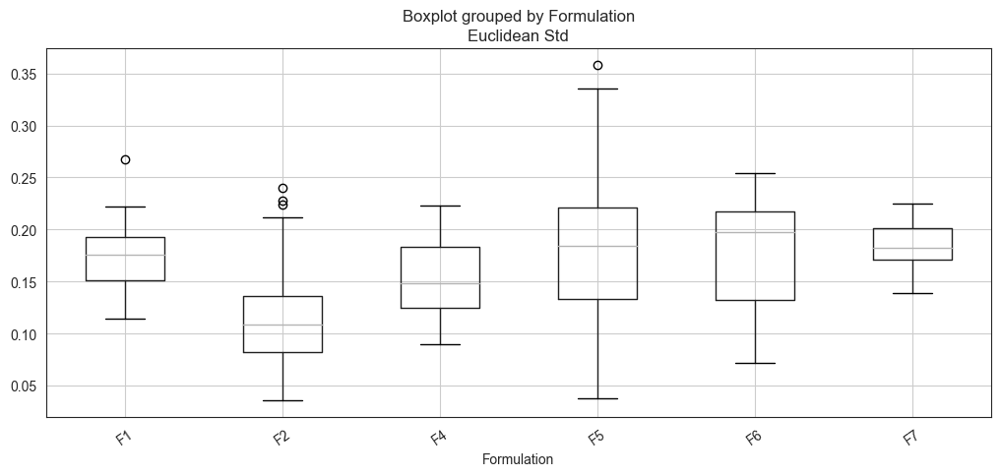

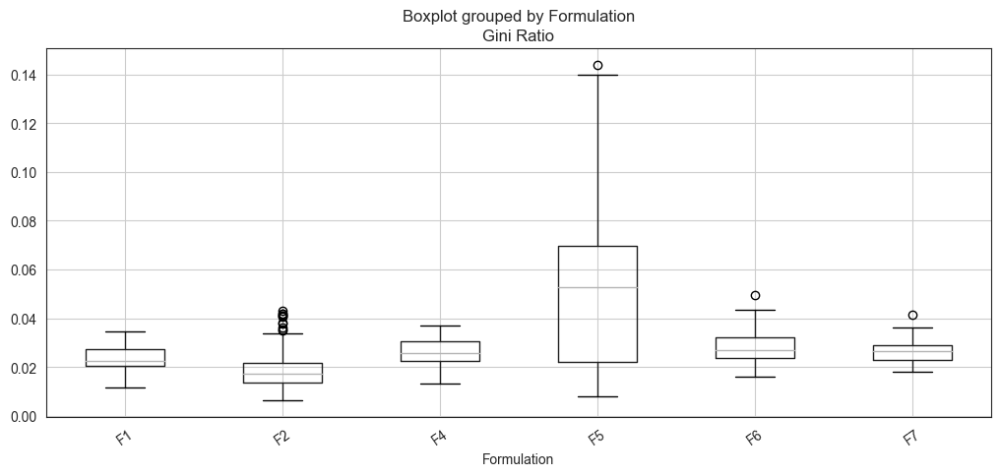

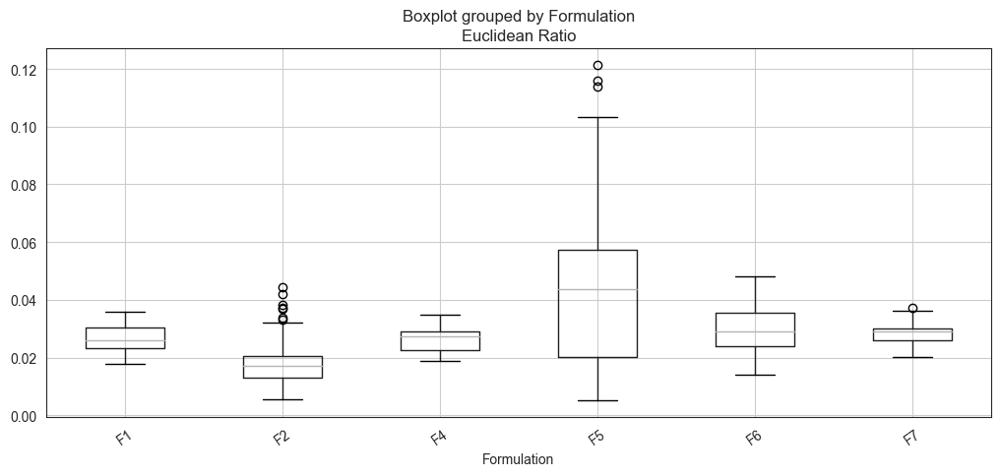

In [843]:
for entry in combined_obj_inequality_metrics.columns[0:-1]:
    combined_obj_inequality_metrics.boxplot(column=entry, by='Formulation', rot=35)
    # plt.savefig(f'figs/by_objective/{entry}_boxplot.jpg')
plt.show()

# Checking for convergence using Epsilon Progress

* Traditional: It is converging more than for the rest 25.000/250.000.
* Gini mean: It is definitely not converging. 6000/250.0000, that is very low. 
* Gini std: 17.500/250.000.
* Euclidean mean: 30.000/250.000. It seems to be far from converging, but the progress indicates otherwise.
* Euclidean std: It converges less than the euclidean mean. This is interesting... 20.000/250.000.


All of them seem to be far from converging.

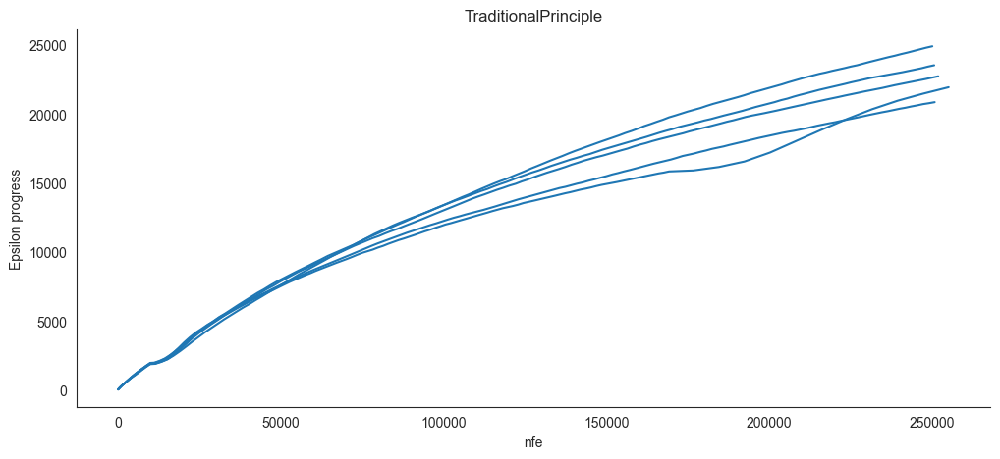

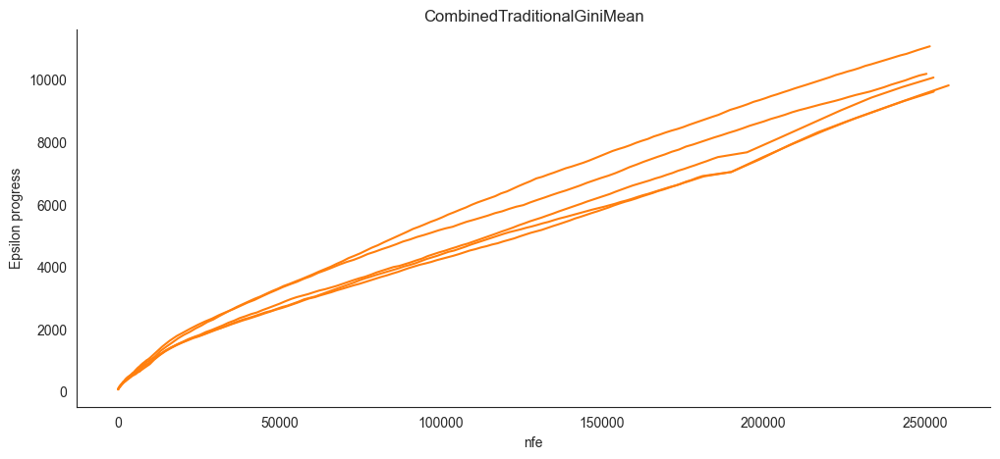

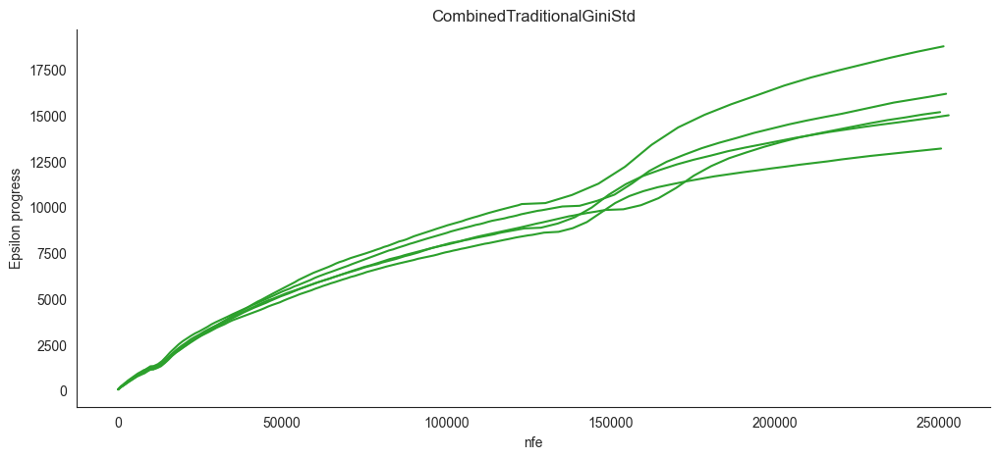

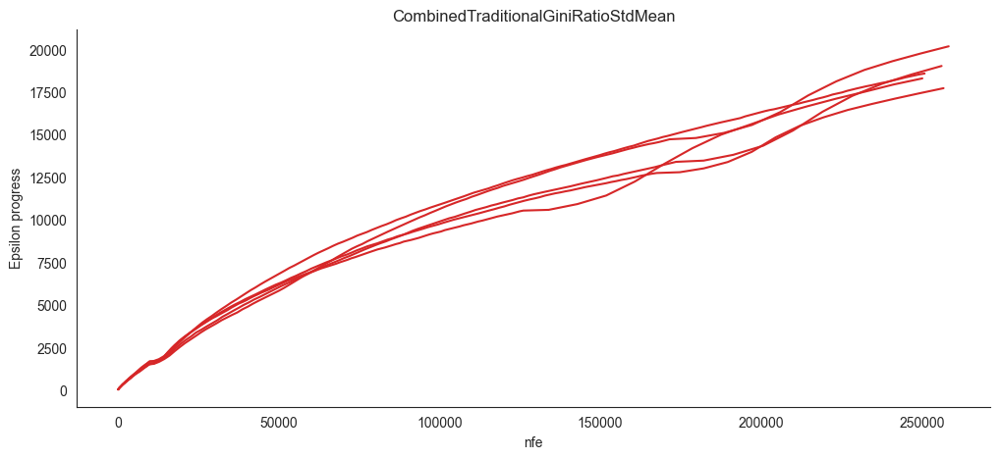

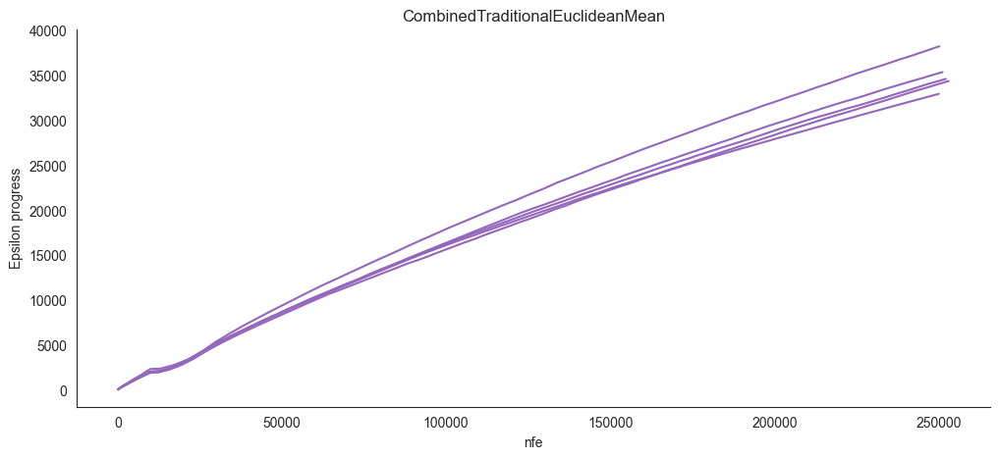

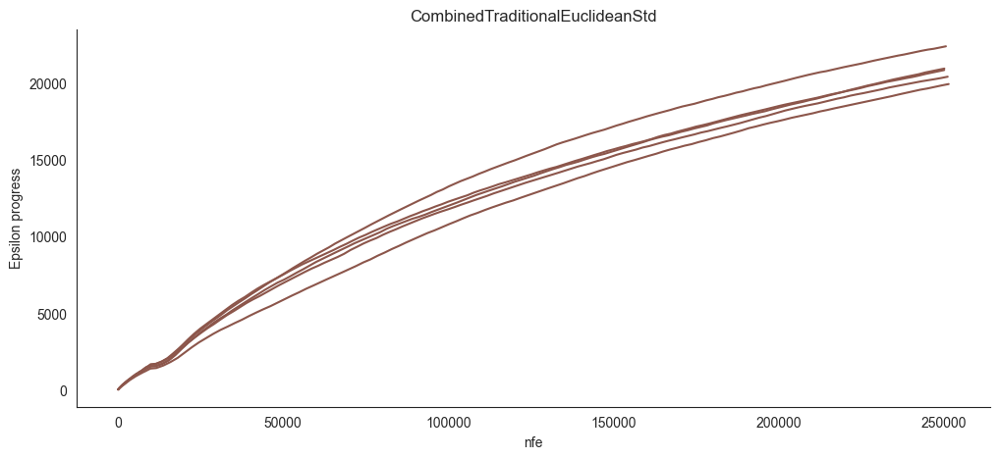

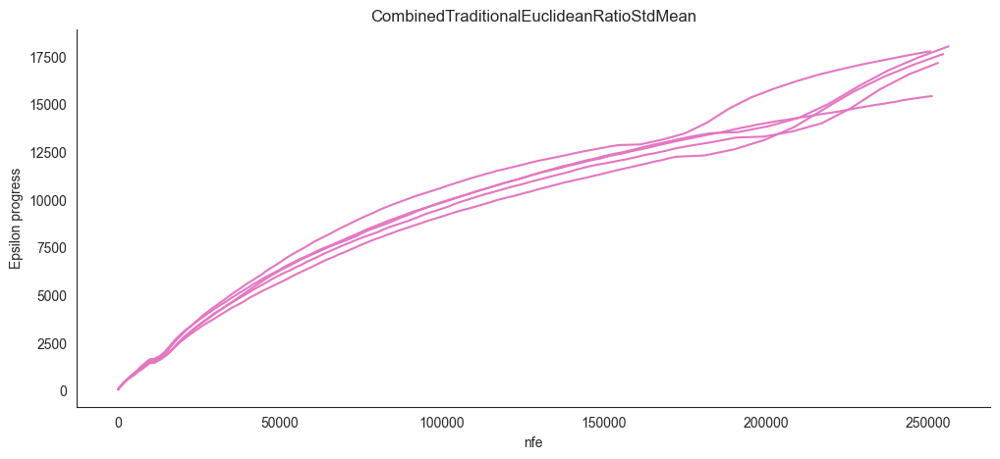

In [844]:
for entry, c in zip(ethical_formulations, sns.color_palette()):
    ep_nfe = {}
    ep_improv = {}
    output_dir = f"/{folder_destination}/{entry}/"
    for i in os.listdir(output_dir):
        if i.endswith("_convergence.csv"):
            ep_load = pd.read_csv(output_dir + i)
            ep_nfe[int(i.split("_")[0])] = ep_load.nfe
            ep_improv[int(i.split("_")[0])]  = ep_load.improvements
    ep_nfe = pd.DataFrame.from_dict(ep_nfe)
    ep_improv = pd.DataFrame.from_dict(ep_improv)
    
    
    fig, ax = plt.subplots(sharex=True)
    ax.plot(ep_nfe, ep_improv, color=c)

    ax.set_xlabel('nfe')
    ax.set_ylabel('Epsilon progress')
    ax.set_title(entry)
    sns.despine()
#     plt.savefig(f'figs/{rbf}/{rbf}_epsprog.jpg')
plt.show()

# Checking for convergence using Hypervolume (method 1)

In [110]:
import sys
import rbf_functions
import os
sys.path.append(os.path.abspath("../.."))
from hypervolume_jk import HypervolumeMetric
from hv_calculation import get_platypus_problem
from hv_calculation import transform_data

In [113]:
refset = pd.read_csv(f"{folder_destination_data}/refsets/{ethical_formulations[1]}_refset.csv", header = 0)
# refset = refset.drop('equity',axis=1)

problem = get_platypus_problem(7, ethical_formulations[1])

In [114]:
# refset = refset.drop("equity")
# refset = refset.reset_index()
# refset = refset.drop('equity')

In [115]:
hv = HypervolumeMetric(refset, problem)

In [116]:
data = pd.read_csv(f"{folder_destination}/{ethical_formulations[1]}/10_hypervolume.csv")
generations = []
for nfe, generation in data.groupby("Unnamed: 0"):
    generation = generation.rename(
        {
            str(i): name
            for i, name in enumerate(
            [
                "hydropower",
                "atomicpowerplant",
                "baltimore",
                "chester",
                "environment",
                "recreation",
                "equity"
            ]
        )
        },
        axis=1,
    )
    generations.append(generation.iloc[:, 2::])

In [118]:
# let's pick one and see what happens
g = generations[10]
# %%timeit
hv.calculate(g)

0.14638950165195017

In [119]:
from deap.tools import _hypervolume
from sklearn.preprocessing import MinMaxScaler
problem = get_platypus_problem(7, 'CombinedTraditionalGiniMean' )

directions = np.asarray([entry for entry in problem.directions])
directions

array([ 1,  1,  1,  1, -1,  1, -1])

In [120]:
df_testt = pd.DataFrame(refset.values)
df_testt

,0,1,2,3,4,5,6
0,57.419404,0.605698,0.053619,0.372416,-0.084460,1.0,-0.201638
1,41.520980,0.669718,0.152515,0.227765,-0.081774,1.0,-0.202931
2,58.074703,0.335548,0.423978,0.113162,-0.087124,1.0,-0.201085
3,39.465134,0.654118,0.068586,0.251685,-0.081216,1.0,-0.217180
4,59.433866,0.110872,0.216295,0.578788,-0.085445,1.0,-0.207893
...,...,...,...,...,...,...,...
156,68.612850,0.984024,0.689883,0.919287,-0.097215,1.0,-0.100568
157,30.120199,0.667551,0.566201,0.037869,-0.085063,1.0,-0.207249
158,75.846303,0.504920,0.126302,0.221936,-0.088090,1.0,-0.210472
159,70.611295,0.467622,0.305582,0.103257,-0.084846,1.0,-0.207064


In [121]:

def handle_directions(data, problem):
    data = data.copy()
    for i in range(data.shape[1]):
        column = data[:, i]
        if problem.directions[i] == problem.MAXIMIZE:
            data[:, i] = 1 - column
    return data



ref_set = refset.values
generation = g.values

# normalize using the min and max across all generations and reference set
# this is slightly different from how platypus handles it
scaler = MinMaxScaler()
# scaler.fit(pd.concat(generations + [refset]).values)
scaler.fit(ref_set)

normalized_refset = scaler.transform(ref_set)
normalized_generation = scaler.transform(generation)

refset_directed = handle_directions(normalized_refset, problem) 
generation_directed = handle_directions(normalized_generation, problem)


maxima = np.max(refset_directed, axis=0)
minima = np.min(refset_directed, axis=0)

print(minima)
print(maxima)
print(_hypervolume.hv.hypervolume(generation_directed, maxima))
print(_hypervolume.hv.hypervolume(normalized_generation, maxima))

[0. 0. 0. 0. 0. 0. 0.]
[1. 1. 1. 1. 1. 1. 1.]
0.14667204799868638
25.605781108404035


In [122]:
from hv_calculation import load_archives

archives, list_of_archives = load_archives(folder_destination)

In [123]:
problem = get_platypus_problem(7, ethical_formulations[1])
scaler = MinMaxScaler()
scaler.fit(pd.concat(list_of_archives + [refset]).values)
reference_set = transform_data(refset.values, scaler, problem)
maxima = np.max(reference_set, axis=0)

In [ ]:
hv = _hypervolume.hv.hypervolume(reference_set, maxima)
dict(hv=hv)

In [125]:
pd.Series(dict(hv=hv)).to_csv('./calculated_metrics/hv_refset_global.csv')

In [126]:
problem = get_platypus_problem(7, ethical_formulations[1])

scaler = MinMaxScaler()
scaler.fit(pd.concat(generations + [refset]).values)


refset_directed = transform_data(refset.values, scaler, problem)
maxima = np.max(refset_directed, axis=0)


hypervolume = []
for generation in generations[0:200]:
    generation_directed = transform_data(generation.values, scaler, problem)
    hv = _hypervolume.hv.hypervolume(generation_directed, maxima)
    hypervolume.append(hv)

KeyboardInterrupt: 

In [ ]:
fig, ax = plt.subplots()
ax.plot(hypervolume)

## Checking for convergence again 

# Checking for convergence using Hypervolume (method 2)

In [80]:
# output_dir = f"../output/{rbf}/"
nfearchive = {}
for n in ethical_formulations:
    nfearchive[n] = {}
for entry in ethical_formulations[1:]:
    name = entry
    output_dir = f"{folder_destination}/{name}/"
    for i in os.listdir(output_dir):
        if i.endswith("_hypervolume.csv"):
#             nfearchive[name][i.split("_")[0]] = pd.read_csv(output_dir + i)
            archives_by_nfe = pd.read_csv(output_dir + i)
            nfes = archives_by_nfe["Unnamed: 0"].values
            u_nfes = np.unique(nfes)
#             selected_nfe = u_nfes[-1::]
            selected_nfe = u_nfes[0::10]
            selected_nfe = np.append(selected_nfe, u_nfes[-1::])
            nfearchive[name][int(i.split("_")[0])] = archives_by_nfe.loc[archives_by_nfe['Unnamed: 0'].isin(selected_nfe)]

In [81]:
from platypus import Solution, Problem, Hypervolume

n_rbfs = 4
n_objs = 7
n_vars = n_rbfs * 8 

problem = Problem(n_vars, n_objs)

# matters for hypervolume
problem.directions[0] = Problem.MAXIMIZE  # hydropower
problem.directions[1] = Problem.MAXIMIZE  # atomic power plant
problem.directions[2] = Problem.MAXIMIZE  # baltimore
problem.directions[3] = Problem.MAXIMIZE  # chester
problem.directions[4] = Problem.MINIMIZE  # environment
problem.directions[5] = Problem.MAXIMIZE  # recreation
problem.directions[6] = Problem.MINIMIZE  # equity


archives = {}
seeds = np.arange(10, 51, 10).tolist()
print(seeds)
for n in ethical_formulations[1:]:
    archives[n] = {}
    for i in seeds:
        archives[n][i] = {}
for entry in ethical_formulations[1:]:
    name = entry
    for s in nfearchive[name]: #nfearchive[name]:
        for nfe, generation in nfearchive[name][s].groupby("Unnamed: 0"):
            # we slice from 2, getting rid of the first two columns 
            # which contain the NFE and ID of each solution
            archive = []
            for i, row in generation.iloc[:, 2::].iterrows():
#                 print(problem)
                solution = Solution(problem)
                solution.objectives = row
                archive.append(solution)
            archives[name][s][nfe] = archive

[10, 20, 30, 40, 50]


In [82]:
# folder_destination_refsets = f'/Users/farleyrimon/Documents/Model_results/Experiment 2/refsets'
ref_sets = {}
for n in ethical_formulations[1:]:
    name = n
    ref_sets[name] = {}
    data = pd.read_csv(f'{folder_destination_data}/{name}_refset.csv')  
    ref_set = []
    for i, row in data.iterrows():
#         print(problem)
        solution = Solution(problem)
#         print(solution)
        solution.objectives = row
        ref_set.append(solution)
    ref_sets[name] = ref_set


FileNotFoundError: [Errno 2] No such file or directory: '/Users/farleyrimon/Documents/GitHub/MUSEH2O/susquehanna/CombinedTraditionalGiniMean_refset.csv'

In [ ]:
ref_sets.keys()


In [ ]:
from datetime import datetime
import datetime as DT

In [ ]:
ethical_formulation = ethical_formulations[1]
tempnfe = {}
temphv = {}
nfe_sets = {}
hv_sets = {}
# for rbf in archives:
nfe_sets[ethical_formulation] = {}
hv_sets[ethical_formulation] = {}
hv = Hypervolume(reference_set=ref_sets[ethical_formulation])
# hv = Hypervolume(reference_set=ref_set) #global
print(f"started {ethical_formulation} at {DT.datetime.now().strftime('%H:%M:%S')}")
# seedl = [10, 20, 30]
for seed in archives[ethical_formulation]:
    nfe_sets[ethical_formulation][seed] = {}
    hv_sets[ethical_formulation][seed] = {}
    s_archives = archives[ethical_formulation][seed]
    nfes = []
    hvs = []
    for nfe, archive in s_archives.items():
        nfes.append(nfe)
        hvs.append(hv.calculate(archive))
    nfe_sets[ethical_formulation][seed] = nfes
    hv_sets[ethical_formulation][seed] = hvs
    tempnfe[seed] = nfes
    temphv[seed] = hvs
    dfhv = pd.DataFrame.from_dict(temphv, orient='index')
    dfnfe = pd.DataFrame.from_dict(tempnfe, orient='index')
    dfhv = dfhv.T
    dfnfe = dfnfe.T
    dfhv.to_csv(f"hv/{ethical_formulation}_hv.csv", index=False)
    dfnfe.to_csv(f"hv/{ethical_formulation}_nfe.csv", index=False)
#     dfhv.to_csv(f"hv_global/{rbf}_hv_all.csv", index=False) #global
#     dfnfe.to_csv(f"hv_global/{rbf}_nfe_all.csv", index=False) #global
    print(f"finished seed: {seed} at {DT.datetime.now().strftime('%H:%M:%S')}")

In [ ]:
rbf = 'original_rbf'

fig, ax = plt.subplots(sharex=True)
for i in nfe_sets_all:
    ax.plot(nfe_sets_all[i], hv_sets_all[i])

ax.set_xlabel('nfe')
ax.set_ylabel('hypervolume')
ax.set_title(ethical_formulations[1])
sns.despine()

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style("white")

# Plot hypervolume for each rbf

for entry, c in zip(rbfs, sns.color_palette()):
    rbf = entry.__name__
    df_hv = pd.read_csv(f"hv/{rbf}_hv.csv")
    df_hv_nfe = pd.read_csv(f"hv/{rbf}_hv_nfe.csv")
    fig, ax = plt.subplots(sharex=True)

    ax.plot(df_hv_nfe, df_hv, color=c)

    ax.set_xlabel('nfe')
    ax.set_ylabel('hypervolume')
    ax.set_title(ethical_formulations[1])
    sns.despine()
#     plt.savefig(f'figs/{rbf}/{rbf}_hv.jpg')
plt.show()